In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
match_data = pd.read_csv('matches.csv')
delivery_data = pd.read_csv('IPL_Ball.csv')
match_data.head()

,ID,City,Date,Season,MatchNumber,Team1,Team2,Venue,TossWinner,TossDecision,SuperOver,WinningTeam,WonBy,Margin,method,Player_of_Match,Team1Players,Team2Players,Umpire1,Umpire2
0,1312200,Ahmedabad,2022-05-29,2022,Final,Rajasthan Royals,Gujarat Titans,"Narendra Modi Stadium, Ahmedabad",Rajasthan Royals,bat,N,Gujarat Titans,Wickets,7.0,NaN,HH Pandya,"['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...","['WP Saha', 'Shubman Gill', 'MS Wade', 'HH Pan...",CB Gaffaney,Nitin Menon
1,1312199,Ahmedabad,2022-05-27,2022,Qualifier 2,Royal Challengers Bangalore,Rajasthan Royals,"Narendra Modi Stadium, Ahmedabad",Rajasthan Royals,field,N,Rajasthan Royals,Wickets,7.0,NaN,JC Buttler,"['V Kohli', 'F du Plessis', 'RM Patidar', 'GJ ...","['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...",CB Gaffaney,Nitin Menon
2,1312198,Kolkata,2022-05-25,2022,Eliminator,Royal Challengers Bangalore,Lucknow Super Giants,"Eden Gardens, Kolkata",Lucknow Super Giants,field,N,Royal Challengers Bangalore,Runs,14.0,NaN,RM Patidar,"['V Kohli', 'F du Plessis', 'RM Patidar', 'GJ ...","['Q de Kock', 'KL Rahul', 'M Vohra', 'DJ Hooda...",J Madanagopal,MA Gough
3,1312197,Kolkata,2022-05-24,2022,Qualifier 1,Rajasthan Royals,Gujarat Titans,"Eden Gardens, Kolkata",Gujarat Titans,field,N,Gujarat Titans,Wickets,7.0,NaN,DA Miller,"['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...","['WP Saha', 'Shubman Gill', 'MS Wade', 'HH Pan...",BNJ Oxenford,VK Sharma
4,1304116,Mumbai,2022-05-22,2022,70,Sunrisers Hyderabad,Punjab Kings,"Wankhede Stadium, Mumbai",Sunrisers Hyderabad,bat,N,Punjab Kings,Wickets,5.0,NaN,Harpreet Brar,"['PK Garg', 'Abhishek Sharma', 'RA Tripathi', ...","['JM Bairstow', 'S Dhawan', 'M Shahrukh Khan',...",AK Chaudhary,NA Patwardhan


In [2]:
match_data.head()

,ID,City,Date,Season,MatchNumber,Team1,Team2,Venue,TossWinner,TossDecision,SuperOver,WinningTeam,WonBy,Margin,method,Player_of_Match,Team1Players,Team2Players,Umpire1,Umpire2
0,1312200,Ahmedabad,2022-05-29,2022,Final,Rajasthan Royals,Gujarat Titans,"Narendra Modi Stadium, Ahmedabad",Rajasthan Royals,bat,N,Gujarat Titans,Wickets,7.0,NaN,HH Pandya,"['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...","['WP Saha', 'Shubman Gill', 'MS Wade', 'HH Pan...",CB Gaffaney,Nitin Menon
1,1312199,Ahmedabad,2022-05-27,2022,Qualifier 2,Royal Challengers Bangalore,Rajasthan Royals,"Narendra Modi Stadium, Ahmedabad",Rajasthan Royals,field,N,Rajasthan Royals,Wickets,7.0,NaN,JC Buttler,"['V Kohli', 'F du Plessis', 'RM Patidar', 'GJ ...","['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...",CB Gaffaney,Nitin Menon
2,1312198,Kolkata,2022-05-25,2022,Eliminator,Royal Challengers Bangalore,Lucknow Super Giants,"Eden Gardens, Kolkata",Lucknow Super Giants,field,N,Royal Challengers Bangalore,Runs,14.0,NaN,RM Patidar,"['V Kohli', 'F du Plessis', 'RM Patidar', 'GJ ...","['Q de Kock', 'KL Rahul', 'M Vohra', 'DJ Hooda...",J Madanagopal,MA Gough
3,1312197,Kolkata,2022-05-24,2022,Qualifier 1,Rajasthan Royals,Gujarat Titans,"Eden Gardens, Kolkata",Gujarat Titans,field,N,Gujarat Titans,Wickets,7.0,NaN,DA Miller,"['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...","['WP Saha', 'Shubman Gill', 'MS Wade', 'HH Pan...",BNJ Oxenford,VK Sharma
4,1304116,Mumbai,2022-05-22,2022,70,Sunrisers Hyderabad,Punjab Kings,"Wankhede Stadium, Mumbai",Sunrisers Hyderabad,bat,N,Punjab Kings,Wickets,5.0,NaN,Harpreet Brar,"['PK Garg', 'Abhishek Sharma', 'RA Tripathi', ...","['JM Bairstow', 'S Dhawan', 'M Shahrukh Khan',...",AK Chaudhary,NA Patwardhan


In [3]:
match_data.tail()

,ID,City,Date,Season,MatchNumber,Team1,Team2,Venue,TossWinner,TossDecision,SuperOver,WinningTeam,WonBy,Margin,method,Player_of_Match,Team1Players,Team2Players,Umpire1,Umpire2
945,335986,Kolkata,2008-04-20,2007/08,4,Kolkata Knight Riders,Deccan Chargers,Eden Gardens,Deccan Chargers,bat,N,Kolkata Knight Riders,Wickets,5.0,NaN,DJ Hussey,"['WP Saha', 'BB McCullum', 'RT Ponting', 'SC G...","['AC Gilchrist', 'Y Venugopal Rao', 'VVS Laxma...",BF Bowden,K Hariharan
946,335985,Mumbai,2008-04-20,2007/08,5,Mumbai Indians,Royal Challengers Bangalore,Wankhede Stadium,Mumbai Indians,bat,N,Royal Challengers Bangalore,Wickets,5.0,NaN,MV Boucher,"['L Ronchi', 'ST Jayasuriya', 'DJ Thornely', '...","['S Chanderpaul', 'R Dravid', 'LRPL Taylor', '...",SJ Davis,DJ Harper
947,335984,Delhi,2008-04-19,2007/08,3,Delhi Daredevils,Rajasthan Royals,Feroz Shah Kotla,Rajasthan Royals,bat,N,Delhi Daredevils,Wickets,9.0,NaN,MF Maharoof,"['G Gambhir', 'V Sehwag', 'S Dhawan', 'MK Tiwa...","['T Kohli', 'YK Pathan', 'SR Watson', 'M Kaif'...",Aleem Dar,GA Pratapkumar
948,335983,Chandigarh,2008-04-19,2007/08,2,Kings XI Punjab,Chennai Super Kings,"Punjab Cricket Association Stadium, Mohali",Chennai Super Kings,bat,N,Chennai Super Kings,Runs,33.0,NaN,MEK Hussey,"['K Goel', 'JR Hopes', 'KC Sangakkara', 'Yuvra...","['PA Patel', 'ML Hayden', 'MEK Hussey', 'MS Dh...",MR Benson,SL Shastri
949,335982,Bangalore,2008-04-18,2007/08,1,Royal Challengers Bangalore,Kolkata Knight Riders,M Chinnaswamy Stadium,Royal Challengers Bangalore,field,N,Kolkata Knight Riders,Runs,140.0,NaN,BB McCullum,"['R Dravid', 'W Jaffer', 'V Kohli', 'JH Kallis...","['SC Ganguly', 'BB McCullum', 'RT Ponting', 'D...",Asad Rauf,RE Koertzen


In [4]:
delivery_data.head()

,ID,innings,overs,ballnumber,batter,bowler,non-striker,extra_type,batsman_run,extras_run,total_run,non_boundary,isWicketDelivery,player_out,kind,fielders_involved,BattingTeam
0,1312200,1,0,1,YBK Jaiswal,Mohammed Shami,JC Buttler,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals
1,1312200,1,0,2,YBK Jaiswal,Mohammed Shami,JC Buttler,legbyes,0,1,1,0,0,NaN,NaN,NaN,Rajasthan Royals
2,1312200,1,0,3,JC Buttler,Mohammed Shami,YBK Jaiswal,NaN,1,0,1,0,0,NaN,NaN,NaN,Rajasthan Royals
3,1312200,1,0,4,YBK Jaiswal,Mohammed Shami,JC Buttler,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals
4,1312200,1,0,5,YBK Jaiswal,Mohammed Shami,JC Buttler,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals


In [5]:
match_data.isnull().sum()

ID                   0
City                51
Date                 0
Season               0
MatchNumber          0
Team1                0
Team2                0
Venue                0
TossWinner           0
TossDecision         0
SuperOver            4
WinningTeam          4
WonBy                0
Margin              18
method             931
Player_of_Match      4
Team1Players         0
Team2Players         0
Umpire1              0
Umpire2              0
dtype: int64

In [6]:
delivery_data.isnull().sum()

ID                        0
innings                   0
overs                     0
ballnumber                0
batter                    0
bowler                    0
non-striker               0
extra_type           213905
batsman_run               0
extras_run                0
total_run                 0
non_boundary              0
isWicketDelivery          0
player_out           214803
kind                 214803
fielders_involved    217966
BattingTeam               0
dtype: int64

In [7]:
match_data.shape

(950, 20)

In [8]:
delivery_data.shape

(225954, 17)

In [9]:
print('match played so far :' , match_data.shape[0])
print('\n city played at :', match_data['City'].unique())
print('\n teams participated :',match_data['Team1'].unique())

match played so far : 950

 city played at : ['Ahmedabad' 'Kolkata' 'Mumbai' 'Navi Mumbai' 'Pune' 'Dubai' 'Sharjah'
 'Abu Dhabi' 'Delhi' 'Chennai' nan 'Hyderabad' 'Visakhapatnam'
 'Chandigarh' 'Bengaluru' 'Jaipur' 'Indore' 'Bangalore' 'Kanpur' 'Rajkot'
 'Raipur' 'Ranchi' 'Cuttack' 'Dharamsala' 'Kochi' 'Nagpur' 'Johannesburg'
 'Centurion' 'Durban' 'Bloemfontein' 'Port Elizabeth' 'Kimberley'
 'East London' 'Cape Town']

 teams participated : ['Rajasthan Royals' 'Royal Challengers Bangalore' 'Sunrisers Hyderabad'
 'Delhi Capitals' 'Chennai Super Kings' 'Gujarat Titans'
 'Lucknow Super Giants' 'Kolkata Knight Riders' 'Punjab Kings'
 'Mumbai Indians' 'Kings XI Punjab' 'Delhi Daredevils'
 'Rising Pune Supergiant' 'Gujarat Lions' 'Rising Pune Supergiants'
 'Pune Warriors' 'Deccan Chargers' 'Kochi Tuskers Kerala']


In [10]:
match_data['Season'] = pd.DatetimeIndex(match_data['Date']).year
match_data.head()

,ID,City,Date,Season,MatchNumber,Team1,Team2,Venue,TossWinner,TossDecision,SuperOver,WinningTeam,WonBy,Margin,method,Player_of_Match,Team1Players,Team2Players,Umpire1,Umpire2
0,1312200,Ahmedabad,2022-05-29,2022,Final,Rajasthan Royals,Gujarat Titans,"Narendra Modi Stadium, Ahmedabad",Rajasthan Royals,bat,N,Gujarat Titans,Wickets,7.0,NaN,HH Pandya,"['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...","['WP Saha', 'Shubman Gill', 'MS Wade', 'HH Pan...",CB Gaffaney,Nitin Menon
1,1312199,Ahmedabad,2022-05-27,2022,Qualifier 2,Royal Challengers Bangalore,Rajasthan Royals,"Narendra Modi Stadium, Ahmedabad",Rajasthan Royals,field,N,Rajasthan Royals,Wickets,7.0,NaN,JC Buttler,"['V Kohli', 'F du Plessis', 'RM Patidar', 'GJ ...","['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...",CB Gaffaney,Nitin Menon
2,1312198,Kolkata,2022-05-25,2022,Eliminator,Royal Challengers Bangalore,Lucknow Super Giants,"Eden Gardens, Kolkata",Lucknow Super Giants,field,N,Royal Challengers Bangalore,Runs,14.0,NaN,RM Patidar,"['V Kohli', 'F du Plessis', 'RM Patidar', 'GJ ...","['Q de Kock', 'KL Rahul', 'M Vohra', 'DJ Hooda...",J Madanagopal,MA Gough
3,1312197,Kolkata,2022-05-24,2022,Qualifier 1,Rajasthan Royals,Gujarat Titans,"Eden Gardens, Kolkata",Gujarat Titans,field,N,Gujarat Titans,Wickets,7.0,NaN,DA Miller,"['YBK Jaiswal', 'JC Buttler', 'SV Samson', 'D ...","['WP Saha', 'Shubman Gill', 'MS Wade', 'HH Pan...",BNJ Oxenford,VK Sharma
4,1304116,Mumbai,2022-05-22,2022,70,Sunrisers Hyderabad,Punjab Kings,"Wankhede Stadium, Mumbai",Sunrisers Hyderabad,bat,N,Punjab Kings,Wickets,5.0,NaN,Harpreet Brar,"['PK Garg', 'Abhishek Sharma', 'RA Tripathi', ...","['JM Bairstow', 'S Dhawan', 'M Shahrukh Khan',...",AK Chaudhary,NA Patwardhan


In [11]:
match_per_season = match_data.groupby(['Season'])['ID'].count().reset_index().rename(columns = {'ID': 'matches'})
match_per_season

,Season,matches
0,2008,58
1,2009,57
2,2010,60
3,2011,73
4,2012,74
5,2013,76
6,2014,60
7,2015,59
8,2016,60
9,2017,59


Text(0.5, 1.0, 'total matches played in each Season')

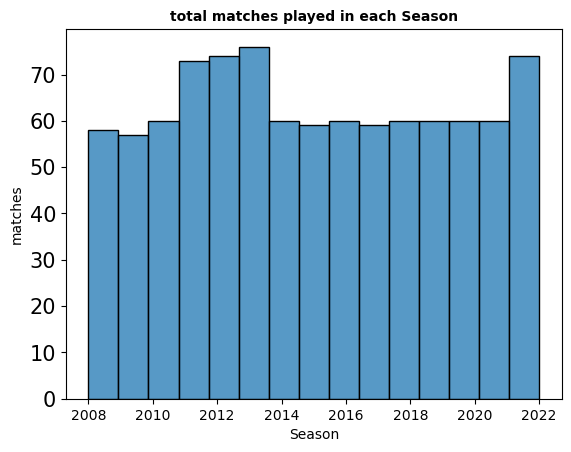

In [12]:
sns.histplot(match_data['Season'],bins=15)
plt.xticks( fontsize=10)
plt.yticks(fontsize=15)
plt.xlabel('Season', fontsize=10)
plt.ylabel('matches', fontsize=10)
plt.title('total matches played in each Season', fontsize = 10, fontweight="bold")

In [13]:
Season_data = match_data[['ID','Season']].merge(delivery_data,left_on='ID',right_on = 'ID', how ='left').drop('ID',axis = 1)
Season_data.head()

,Season,innings,overs,ballnumber,batter,bowler,non-striker,extra_type,batsman_run,extras_run,total_run,non_boundary,isWicketDelivery,player_out,kind,fielders_involved,BattingTeam
0,2022,1,0,1,YBK Jaiswal,Mohammed Shami,JC Buttler,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals
1,2022,1,0,2,YBK Jaiswal,Mohammed Shami,JC Buttler,legbyes,0,1,1,0,0,NaN,NaN,NaN,Rajasthan Royals
2,2022,1,0,3,JC Buttler,Mohammed Shami,YBK Jaiswal,NaN,1,0,1,0,0,NaN,NaN,NaN,Rajasthan Royals
3,2022,1,0,4,YBK Jaiswal,Mohammed Shami,JC Buttler,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals
4,2022,1,0,5,YBK Jaiswal,Mohammed Shami,JC Buttler,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals


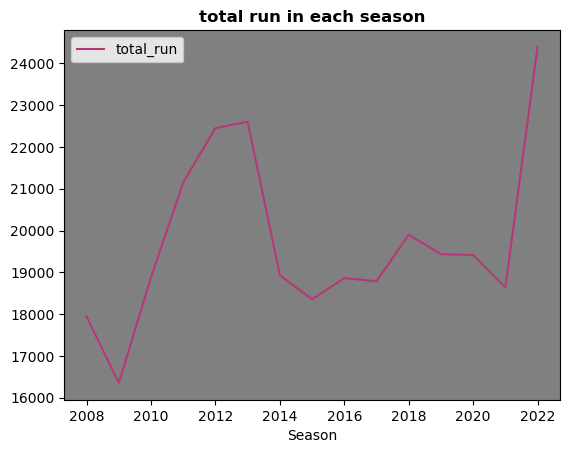

In [14]:
season =Season_data.groupby(['Season'])['total_run'].sum().reset_index()
p = season.set_index('Season')
ax = plt.axes()
ax.set(facecolor = "grey")
sns.lineplot(data=p,palette="magma")
plt.title('total run in each season',fontsize=12,fontweight="bold")
plt.show()

In [15]:
runs_per_season = pd.concat([match_per_season,season.iloc[:,1]],axis=1)
runs_per_season['Run scored per match']=runs_per_season['total_run']/runs_per_season['matches']
runs_per_season.set_index('Season',inplace=True)
runs_per_season

,matches,total_run,Run scored per match
Season,,,
2008,58,17937,309.258621
2009,57,16353,286.894737
2010,60,18883,314.716667
2011,73,21154,289.780822
2012,74,22453,303.418919
2013,76,22602,297.394737
2014,60,18931,315.516667
2015,59,18353,311.067797
2016,60,18862,314.366667


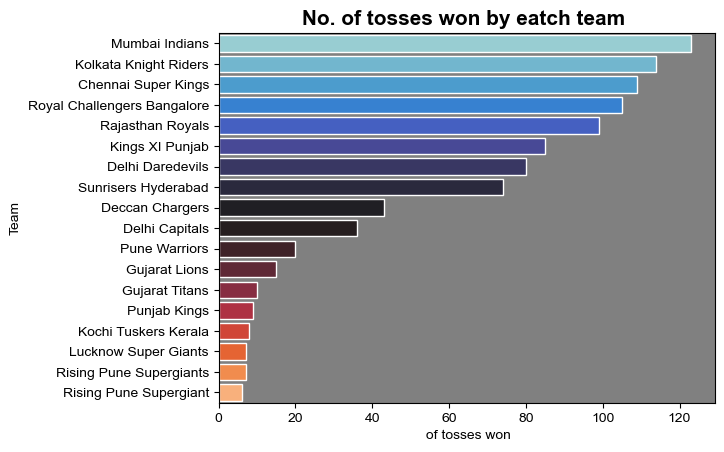

In [16]:
toss=match_data['TossWinner'].value_counts()
ax = plt.axes()
ax.set(facecolor = "grey")
sns.set(rc = {'figure.figsize' : (15,10)},style='darkgrid')
ax.set_title('No. of tosses won by eatch team ',fontsize=15, fontweight="bold")
sns.barplot(y=toss.index, x=toss, orient='h',palette = "icefire", saturation=1)
plt.xlabel(' of tosses won')
plt.ylabel('Team')
plt.show()

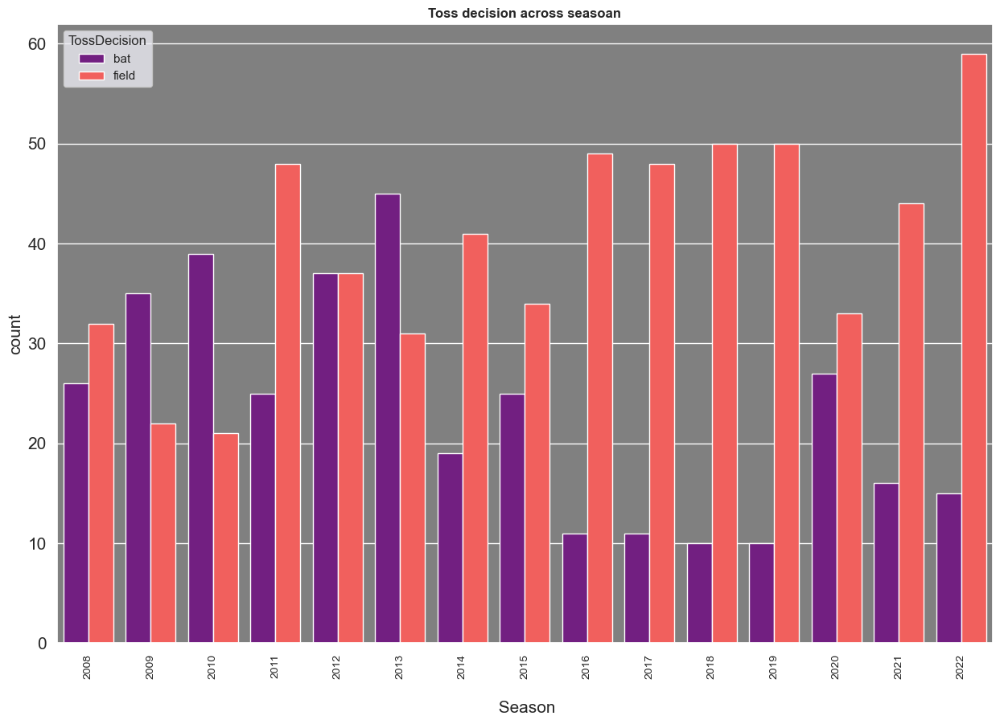

In [17]:
ax = plt.axes()
ax.set(facecolor="grey")
sns.countplot(x='Season', hue='TossDecision', data = match_data,palette="magma",saturation=1)
plt.xticks(rotation=90,fontsize=10)
plt.yticks(fontsize=15)
plt.xlabel('\n Season',fontsize=15)
plt.ylabel('count',fontsize=15)
plt.title('Toss decision across seasoan', fontsize=12,fontweight="bold")
plt.show()

In [18]:
match_data['WonBy'].value_counts()

WonBy
Wickets      509
Runs         423
SuperOver     14
NoResults      4
Name: count, dtype: int64

In [19]:
match_data.Venue[match_data.WonBy!='Runs'].mode()

0    Eden Gardens
Name: Venue, dtype: object

In [20]:
match_data.Venue[match_data.WonBy!='Wickets'].mode()

0    Wankhede Stadium
Name: Venue, dtype: object

In [21]:
filtered_data = match_data[(match_data['TossWinner'] == 'Rajasthan Royals') & ((match_data['Team1'] == 'Rajasthan Royals') | (match_data['Team2'] == 'Gujarat Titans'))]
mode_venue = filtered_data['Venue'].mode()
print(" won the toss and played:")
print(mode_venue)

 won the toss and played:
0    Sawai Mansingh Stadium
Name: Venue, dtype: object


In [22]:
match_data.WinningTeam[match_data.WonBy!='Runs'].mode()

0    Kolkata Knight Riders
Name: WinningTeam, dtype: object

In [23]:
match_data.WinningTeam[match_data.WonBy!='Wickets'].mode()

0    Mumbai Indians
Name: WinningTeam, dtype: object

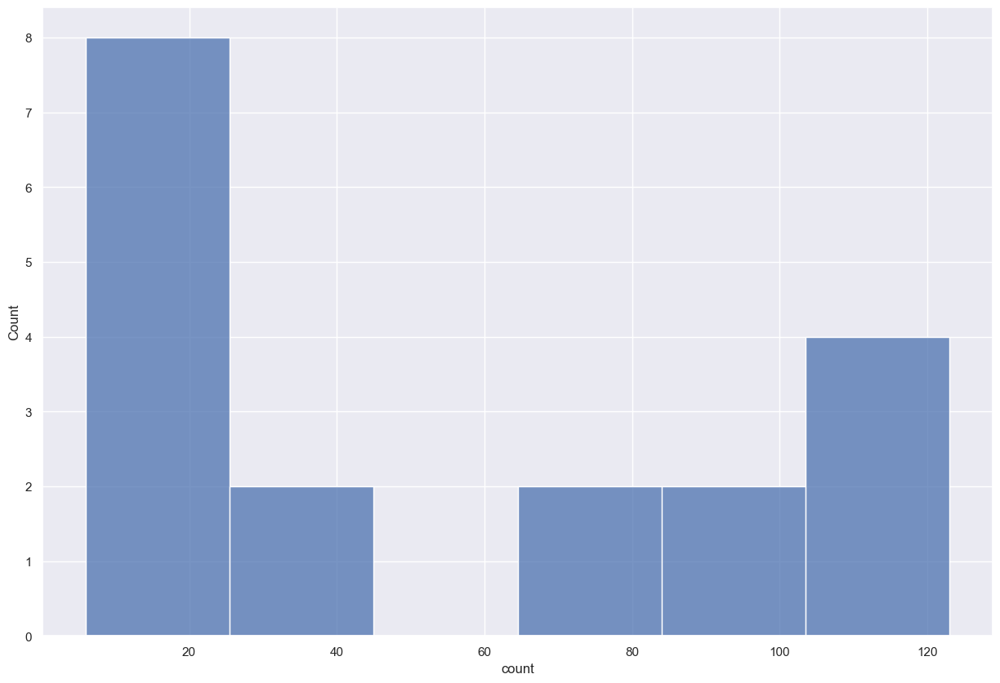

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


Text(0.5, 1.0, 'total matches played in each Season')

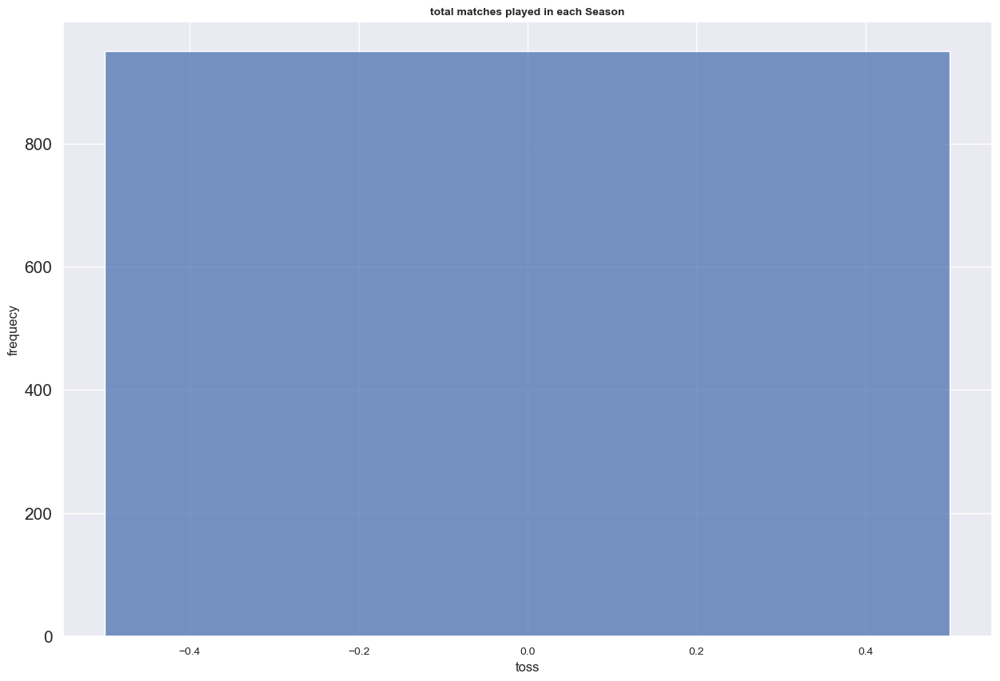

In [28]:
toss1 = match_data['TossDecision'] == match_data['WinningTeam']
plt.figutre = (15,10)
sns.histplot(toss)
plt.show()
sns.histplot(toss1)
plt.xticks( fontsize=10)
plt.yticks(fontsize=15)
plt.xlabel('toss')
plt.ylabel('frequecy')
plt.title('total matches played in each Season', fontsize = 10, fontweight="bold")

In [29]:
toss.tail()

TossWinner
Punjab Kings               9
Kochi Tuskers Kerala       8
Lucknow Super Giants       7
Rising Pune Supergiants    7
Rising Pune Supergiant     6
Name: count, dtype: int64

<Axes: ylabel='Count'>

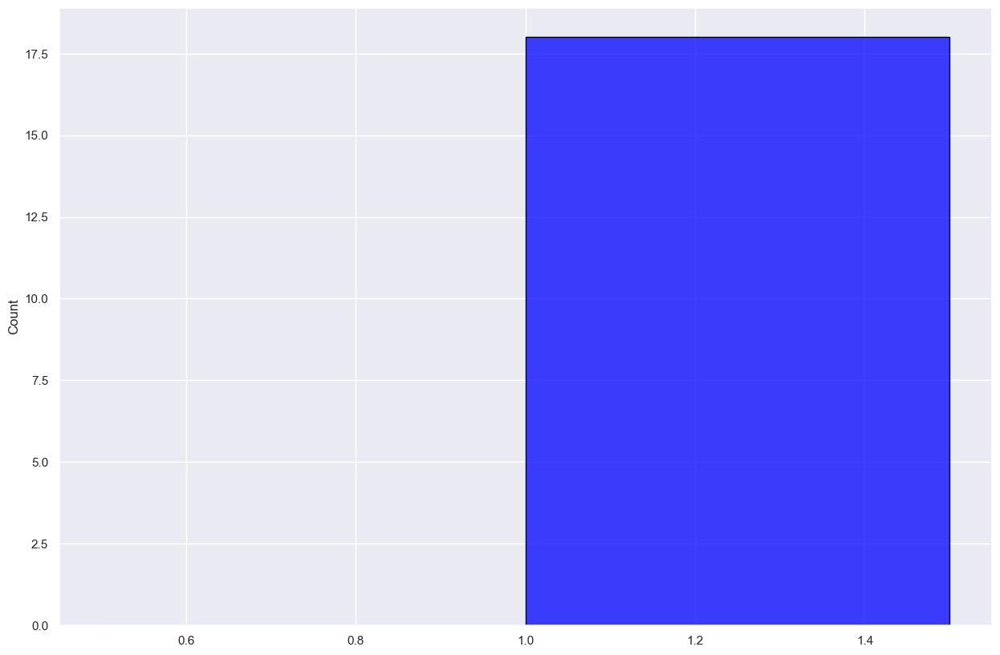

In [30]:
numeric_data = [1 if x else 0 for x in toss]
sns.histplot(numeric_data, bins=2, color="blue", edgecolor = "black")

In [32]:
player = (delivery_data['batter']=='JC Buttler')
df_Buttler = delivery_data[player]
df_Buttler.head()

,ID,innings,overs,ballnumber,batter,bowler,non-striker,extra_type,batsman_run,extras_run,total_run,non_boundary,isWicketDelivery,player_out,kind,fielders_involved,BattingTeam
2,1312200,1,0,3,JC Buttler,Mohammed Shami,YBK Jaiswal,NaN,1,0,1,0,0,NaN,NaN,NaN,Rajasthan Royals
6,1312200,1,1,1,JC Buttler,Yash Dayal,YBK Jaiswal,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals
7,1312200,1,1,2,JC Buttler,Yash Dayal,YBK Jaiswal,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals
8,1312200,1,1,3,JC Buttler,Yash Dayal,YBK Jaiswal,NaN,4,0,4,0,0,NaN,NaN,NaN,Rajasthan Royals
9,1312200,1,1,4,JC Buttler,Yash Dayal,YBK Jaiswal,NaN,0,0,0,0,0,NaN,NaN,NaN,Rajasthan Royals


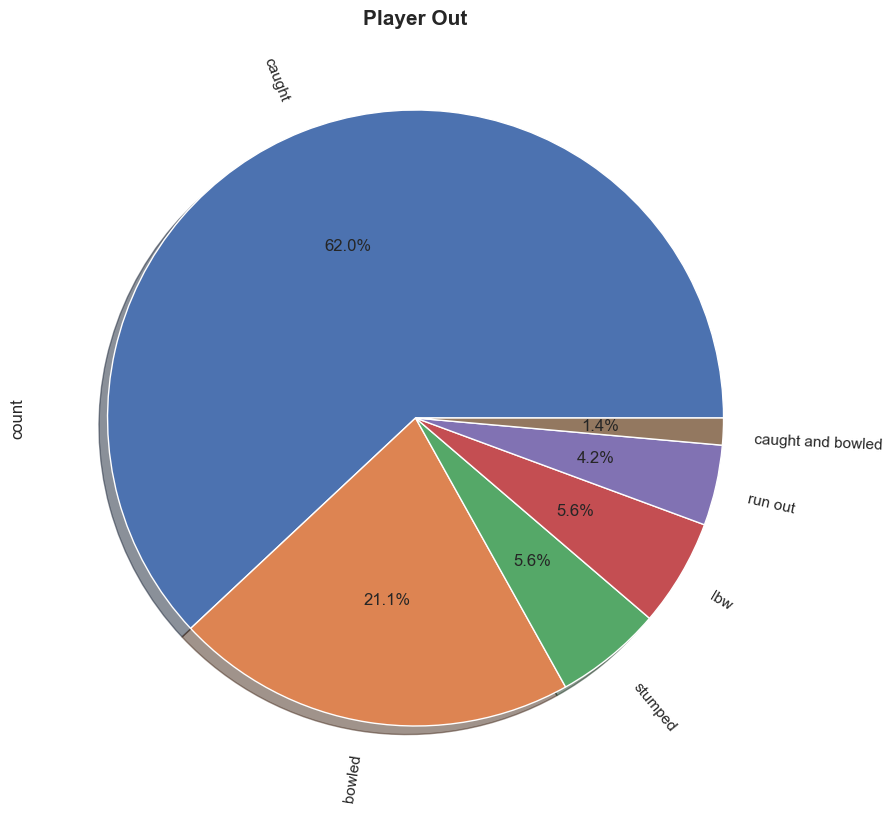

In [33]:
df_Buttler['kind'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,rotatelabels=True)
plt.title("Player Out", fontweight="bold",fontsize=15)
plt.show()

In [34]:
delivery_data['fitness_score']= 2*delivery_data['batsman_run']+0.5*delivery_data['ballnumber']

In [35]:
fitness_threshold = 5

In [36]:
delivery_data.tail()

,ID,innings,overs,ballnumber,batter,bowler,non-striker,extra_type,batsman_run,extras_run,total_run,non_boundary,isWicketDelivery,player_out,kind,fielders_involved,BattingTeam,fitness_score
225949,335982,2,14,5,P Kumar,I Sharma,SB Joshi,legbyes,0,1,1,0,0,NaN,NaN,NaN,Royal Challengers Bangalore,2.5
225950,335982,2,14,6,SB Joshi,I Sharma,P Kumar,NaN,1,0,1,0,0,NaN,NaN,NaN,Royal Challengers Bangalore,5.0
225951,335982,2,14,7,P Kumar,I Sharma,SB Joshi,NaN,0,0,0,0,0,NaN,NaN,NaN,Royal Challengers Bangalore,3.5
225952,335982,2,15,1,SB Joshi,LR Shukla,P Kumar,wides,0,1,1,0,0,NaN,NaN,NaN,Royal Challengers Bangalore,0.5
225953,335982,2,15,2,SB Joshi,LR Shukla,P Kumar,NaN,0,0,0,0,1,SB Joshi,caught,BB McCullum,Royal Challengers Bangalore,1.0


In [37]:
for index, player in delivery_data.iterrows():
    if player['fitness_score'] >= fitness_threshold:
        print(f"{player['batter']} is fit with a fitness score of {player['fitness_score']}.")
    else:
        print(f"{player['batter']} needs to work on fitness with a score of {player['fitness_score']}.")

YBK Jaiswal needs to work on fitness with a score of 0.5.
YBK Jaiswal needs to work on fitness with a score of 1.0.
JC Buttler needs to work on fitness with a score of 3.5.
YBK Jaiswal needs to work on fitness with a score of 2.0.
YBK Jaiswal needs to work on fitness with a score of 2.5.
YBK Jaiswal needs to work on fitness with a score of 3.0.
JC Buttler needs to work on fitness with a score of 0.5.
JC Buttler needs to work on fitness with a score of 1.0.
JC Buttler is fit with a fitness score of 9.5.
JC Buttler needs to work on fitness with a score of 2.0.
JC Buttler needs to work on fitness with a score of 4.5.
YBK Jaiswal needs to work on fitness with a score of 3.0.
JC Buttler needs to work on fitness with a score of 2.5.
YBK Jaiswal needs to work on fitness with a score of 1.0.
YBK Jaiswal is fit with a fitness score of 9.5.
YBK Jaiswal needs to work on fitness with a score of 2.0.
YBK Jaiswal is fit with a fitness score of 14.5.
YBK Jaiswal is fit with a fitness score of 9.0.
YB

MP Stoinis needs to work on fitness with a score of 0.5.
MP Stoinis needs to work on fitness with a score of 1.0.
MP Stoinis is fit with a fitness score of 5.5.
MP Stoinis needs to work on fitness with a score of 4.0.
Mohsin Khan needs to work on fitness with a score of 4.5.
MP Stoinis is fit with a fitness score of 15.0.
Mohsin Khan needs to work on fitness with a score of 2.5.
MP Stoinis needs to work on fitness with a score of 1.0.
MP Stoinis is fit with a fitness score of 9.5.
MP Stoinis needs to work on fitness with a score of 4.0.
Mohsin Khan needs to work on fitness with a score of 2.5.
Mohsin Khan needs to work on fitness with a score of 3.0.
Mohsin Khan is fit with a fitness score of 7.5.
Mohsin Khan needs to work on fitness with a score of 4.0.
Mohsin Khan is fit with a fitness score of 12.5.
MP Stoinis is fit with a fitness score of 12.5.
MP Stoinis needs to work on fitness with a score of 1.0.
Avesh Khan needs to work on fitness with a score of 1.5.
Avesh Khan needs to work

PBB Rajapaksa needs to work on fitness with a score of 1.5.
PBB Rajapaksa needs to work on fitness with a score of 4.0.
JM Bairstow needs to work on fitness with a score of 2.5.
JM Bairstow needs to work on fitness with a score of 3.0.
JM Bairstow needs to work on fitness with a score of 3.5.
PBB Rajapaksa needs to work on fitness with a score of 0.5.
PBB Rajapaksa is fit with a fitness score of 13.0.
PBB Rajapaksa needs to work on fitness with a score of 1.5.
PBB Rajapaksa needs to work on fitness with a score of 4.0.
JM Bairstow needs to work on fitness with a score of 4.5.
PBB Rajapaksa needs to work on fitness with a score of 3.0.
JM Bairstow needs to work on fitness with a score of 0.5.
JM Bairstow is fit with a fitness score of 9.0.
JM Bairstow needs to work on fitness with a score of 3.5.
PBB Rajapaksa needs to work on fitness with a score of 4.0.
JM Bairstow needs to work on fitness with a score of 4.5.
PBB Rajapaksa is fit with a fitness score of 5.0.
PBB Rajapaksa needs to wo

DA Miller is fit with a fitness score of 5.0.
DA Miller needs to work on fitness with a score of 4.5.
DA Miller needs to work on fitness with a score of 3.0.
R Tewatia is fit with a fitness score of 9.5.
R Tewatia is fit with a fitness score of 10.0.
R Tewatia needs to work on fitness with a score of 2.5.
R Tewatia needs to work on fitness with a score of 3.0.
DA Miller needs to work on fitness with a score of 2.5.
R Tewatia needs to work on fitness with a score of 3.0.
DA Miller needs to work on fitness with a score of 1.5.
DA Miller is fit with a fitness score of 6.0.
DA Miller needs to work on fitness with a score of 2.5.
DA Miller is fit with a fitness score of 5.0.
R Tewatia is fit with a fitness score of 5.5.
R Tewatia needs to work on fitness with a score of 4.5.
R Tewatia needs to work on fitness with a score of 1.0.
R Tewatia is fit with a fitness score of 13.5.
R Tewatia is fit with a fitness score of 10.0.
R Tewatia needs to work on fitness with a score of 4.5.
DA Miller is 

SN Khan needs to work on fitness with a score of 4.5.
DA Warner is fit with a fitness score of 11.0.
SN Khan needs to work on fitness with a score of 0.5.
SN Khan needs to work on fitness with a score of 3.0.
DA Warner is fit with a fitness score of 9.5.
DA Warner needs to work on fitness with a score of 4.0.
SN Khan needs to work on fitness with a score of 2.5.
SN Khan is fit with a fitness score of 5.0.
DA Warner is fit with a fitness score of 5.5.
DA Warner needs to work on fitness with a score of 2.5.
SN Khan needs to work on fitness with a score of 3.0.
DA Warner is fit with a fitness score of 9.5.
Anuj Rawat needs to work on fitness with a score of 0.5.
Anuj Rawat needs to work on fitness with a score of 1.0.
Anuj Rawat needs to work on fitness with a score of 1.5.
Anuj Rawat needs to work on fitness with a score of 2.0.
Anuj Rawat is fit with a fitness score of 10.5.
Anuj Rawat needs to work on fitness with a score of 3.0.
V Kohli needs to work on fitness with a score of 3.5.
F 

SV Samson is fit with a fitness score of 5.0.
SV Samson needs to work on fitness with a score of 1.5.
SV Samson needs to work on fitness with a score of 2.0.
SV Samson needs to work on fitness with a score of 2.5.
SV Samson needs to work on fitness with a score of 3.0.
D Padikkal needs to work on fitness with a score of 2.5.
SV Samson is fit with a fitness score of 9.0.
SV Samson needs to work on fitness with a score of 3.5.
D Padikkal needs to work on fitness with a score of 2.0.
D Padikkal needs to work on fitness with a score of 2.5.
D Padikkal is fit with a fitness score of 5.0.
SV Samson needs to work on fitness with a score of 3.5.
D Padikkal needs to work on fitness with a score of 2.5.
SV Samson is fit with a fitness score of 9.0.
SV Samson needs to work on fitness with a score of 3.5.
D Padikkal needs to work on fitness with a score of 2.0.
D Padikkal needs to work on fitness with a score of 2.5.
D Padikkal needs to work on fitness with a score of 3.0.
SV Samson needs to work 

RR Pant needs to work on fitness with a score of 0.5.
Lalit Yadav is fit with a fitness score of 5.0.
Lalit Yadav is fit with a fitness score of 5.5.
Lalit Yadav needs to work on fitness with a score of 4.0.
RR Pant needs to work on fitness with a score of 4.5.
Lalit Yadav needs to work on fitness with a score of 3.0.
RR Pant is fit with a fitness score of 8.5.
RR Pant needs to work on fitness with a score of 1.0.
RR Pant is fit with a fitness score of 9.5.
RR Pant needs to work on fitness with a score of 2.0.
RR Pant needs to work on fitness with a score of 2.5.
RR Pant is fit with a fitness score of 5.0.
R Powell is fit with a fitness score of 11.5.
RR Pant needs to work on fitness with a score of 0.5.
RR Pant needs to work on fitness with a score of 3.0.
R Powell needs to work on fitness with a score of 3.5.
RR Pant needs to work on fitness with a score of 4.0.
R Powell needs to work on fitness with a score of 4.5.
RR Pant is fit with a fitness score of 5.0.
RR Pant is fit with a fi

Shubman Gill is fit with a fitness score of 7.0.
N Rana needs to work on fitness with a score of 2.5.
Shubman Gill needs to work on fitness with a score of 3.0.
N Rana needs to work on fitness with a score of 3.5.
Shubman Gill is fit with a fitness score of 14.0.
Shubman Gill needs to work on fitness with a score of 4.5.
N Rana needs to work on fitness with a score of 3.0.
Shubman Gill needs to work on fitness with a score of 0.5.
Shubman Gill needs to work on fitness with a score of 3.0.
RA Tripathi needs to work on fitness with a score of 3.5.
Shubman Gill needs to work on fitness with a score of 2.0.
KD Karthik needs to work on fitness with a score of 2.5.
KD Karthik needs to work on fitness with a score of 3.0.
RA Tripathi needs to work on fitness with a score of 0.5.
RA Tripathi needs to work on fitness with a score of 1.0.
RA Tripathi needs to work on fitness with a score of 1.5.
RA Tripathi needs to work on fitness with a score of 2.0.
RA Tripathi needs to work on fitness with a

S Dhawan is fit with a fitness score of 10.0.
S Dhawan needs to work on fitness with a score of 2.5.
S Dhawan needs to work on fitness with a score of 3.0.
PP Shaw is fit with a fitness score of 8.5.
PP Shaw needs to work on fitness with a score of 1.0.
PP Shaw is fit with a fitness score of 9.5.
PP Shaw needs to work on fitness with a score of 2.0.
PP Shaw needs to work on fitness with a score of 2.5.
S Dhawan needs to work on fitness with a score of 3.0.
SS Iyer needs to work on fitness with a score of 4.5.
SS Iyer needs to work on fitness with a score of 1.0.
SS Iyer needs to work on fitness with a score of 3.5.
S Dhawan is fit with a fitness score of 10.0.
S Dhawan needs to work on fitness with a score of 2.5.
S Dhawan needs to work on fitness with a score of 3.0.
SS Iyer needs to work on fitness with a score of 0.5.
SS Iyer needs to work on fitness with a score of 1.0.
SS Iyer needs to work on fitness with a score of 1.5.
SS Iyer needs to work on fitness with a score of 4.0.
S Dha

F du Plessis needs to work on fitness with a score of 3.5.
RA Jadeja needs to work on fitness with a score of 2.0.
F du Plessis is fit with a fitness score of 14.5.
F du Plessis is fit with a fitness score of 5.0.
F du Plessis is fit with a fitness score of 8.5.
F du Plessis is fit with a fitness score of 13.0.
F du Plessis needs to work on fitness with a score of 1.5.
RA Jadeja needs to work on fitness with a score of 4.0.
DJ Bravo needs to work on fitness with a score of 2.5.
DJ Bravo is fit with a fitness score of 11.0.
DJ Bravo needs to work on fitness with a score of 3.5.
KL Rahul needs to work on fitness with a score of 2.5.
MA Agarwal needs to work on fitness with a score of 1.0.
MA Agarwal needs to work on fitness with a score of 1.5.
MA Agarwal needs to work on fitness with a score of 4.0.
KL Rahul is fit with a fitness score of 10.5.
KL Rahul needs to work on fitness with a score of 3.0.
KL Rahul is fit with a fitness score of 11.5.
MA Agarwal needs to work on fitness with a 

SP Narine needs to work on fitness with a score of 2.0.
AD Russell needs to work on fitness with a score of 2.5.
AD Russell needs to work on fitness with a score of 3.0.
Shubman Gill needs to work on fitness with a score of 2.5.
AD Russell needs to work on fitness with a score of 3.0.
Shubman Gill needs to work on fitness with a score of 1.5.
Shubman Gill needs to work on fitness with a score of 4.0.
AD Russell needs to work on fitness with a score of 2.5.
AD Russell needs to work on fitness with a score of 3.0.
Shubman Gill needs to work on fitness with a score of 2.5.
AD Russell needs to work on fitness with a score of 3.0.
Shubman Gill needs to work on fitness with a score of 3.5.
AD Russell needs to work on fitness with a score of 2.0.
AD Russell needs to work on fitness with a score of 4.5.
Shubman Gill needs to work on fitness with a score of 3.0.
KD Karthik needs to work on fitness with a score of 0.5.
KD Karthik needs to work on fitness with a score of 3.0.
AD Russell needs to 

JM Bairstow needs to work on fitness with a score of 0.5.
JM Bairstow needs to work on fitness with a score of 3.0.
DA Warner needs to work on fitness with a score of 3.5.
JM Bairstow is fit with a fitness score of 6.0.
JM Bairstow needs to work on fitness with a score of 4.5.
DA Warner is fit with a fitness score of 5.0.
DA Warner needs to work on fitness with a score of 2.5.
JM Bairstow needs to work on fitness with a score of 1.0.
JM Bairstow is fit with a fitness score of 13.5.
JM Bairstow needs to work on fitness with a score of 2.0.
JM Bairstow needs to work on fitness with a score of 2.5.
JM Bairstow needs to work on fitness with a score of 3.0.
DA Warner is fit with a fitness score of 8.5.
DA Warner needs to work on fitness with a score of 1.0.
DA Warner is fit with a fitness score of 5.5.
DA Warner needs to work on fitness with a score of 2.0.
DA Warner needs to work on fitness with a score of 2.5.
DA Warner is fit with a fitness score of 7.0.
DA Warner is fit with a fitness s

SV Samson is fit with a fitness score of 10.0.
SV Samson needs to work on fitness with a score of 2.5.
SV Samson is fit with a fitness score of 11.0.
M Vohra needs to work on fitness with a score of 0.5.
M Vohra needs to work on fitness with a score of 1.0.
JC Buttler needs to work on fitness with a score of 3.5.
SV Samson needs to work on fitness with a score of 2.0.
SV Samson needs to work on fitness with a score of 2.5.
SV Samson is fit with a fitness score of 11.0.
JC Buttler is fit with a fitness score of 8.5.
JC Buttler is fit with a fitness score of 9.0.
JC Buttler is fit with a fitness score of 9.5.
JC Buttler is fit with a fitness score of 10.0.
JC Buttler needs to work on fitness with a score of 4.5.
SV Samson is fit with a fitness score of 5.0.
SV Samson is fit with a fitness score of 8.5.
SV Samson needs to work on fitness with a score of 3.0.
JC Buttler needs to work on fitness with a score of 1.5.
JC Buttler needs to work on fitness with a score of 4.0.
SV Samson is fit w

MS Dhoni needs to work on fitness with a score of 2.5.
MS Dhoni is fit with a fitness score of 5.0.
MS Dhoni is fit with a fitness score of 8.5.
MS Dhoni needs to work on fitness with a score of 1.0.
MS Dhoni needs to work on fitness with a score of 1.5.
MS Dhoni needs to work on fitness with a score of 2.0.
MS Dhoni needs to work on fitness with a score of 2.5.
MS Dhoni needs to work on fitness with a score of 3.0.
RD Gaikwad needs to work on fitness with a score of 0.5.
RD Gaikwad is fit with a fitness score of 9.0.
RD Gaikwad needs to work on fitness with a score of 1.5.
RD Gaikwad is fit with a fitness score of 14.0.
PP Shaw needs to work on fitness with a score of 0.5.
AM Rahane needs to work on fitness with a score of 1.0.
AM Rahane needs to work on fitness with a score of 1.5.
AM Rahane needs to work on fitness with a score of 2.0.
AM Rahane needs to work on fitness with a score of 2.5.
AM Rahane needs to work on fitness with a score of 3.0.
AM Rahane is fit with a fitness score

KS Williamson needs to work on fitness with a score of 2.5.
JM Bairstow needs to work on fitness with a score of 3.0.
KS Williamson needs to work on fitness with a score of 3.5.
JM Bairstow needs to work on fitness with a score of 4.0.
KS Williamson needs to work on fitness with a score of 4.5.
JM Bairstow needs to work on fitness with a score of 3.0.
KS Williamson needs to work on fitness with a score of 2.5.
JM Bairstow needs to work on fitness with a score of 3.0.
KS Williamson is fit with a fitness score of 9.5.
KS Williamson needs to work on fitness with a score of 4.0.
JM Bairstow needs to work on fitness with a score of 4.5.
KS Williamson is fit with a fitness score of 5.0.
KS Williamson needs to work on fitness with a score of 2.5.
JM Bairstow needs to work on fitness with a score of 3.0.
KS Williamson needs to work on fitness with a score of 3.5.
JM Bairstow needs to work on fitness with a score of 4.0.
KS Williamson is fit with a fitness score of 6.5.
KS Williamson is fit wit

JC Buttler needs to work on fitness with a score of 2.5.
JC Buttler is fit with a fitness score of 5.0.
SPD Smith is fit with a fitness score of 5.5.
SPD Smith needs to work on fitness with a score of 2.5.
JC Buttler needs to work on fitness with a score of 1.0.
JC Buttler needs to work on fitness with a score of 3.5.
SPD Smith is fit with a fitness score of 6.0.
SPD Smith is fit with a fitness score of 6.5.
SPD Smith is fit with a fitness score of 5.0.
SPD Smith needs to work on fitness with a score of 2.5.
JC Buttler is fit with a fitness score of 5.0.
JC Buttler needs to work on fitness with a score of 1.5.
JC Buttler needs to work on fitness with a score of 2.0.
JC Buttler needs to work on fitness with a score of 4.5.
SPD Smith is fit with a fitness score of 5.0.
SPD Smith needs to work on fitness with a score of 2.5.
JC Buttler needs to work on fitness with a score of 3.0.
SPD Smith is fit with a fitness score of 9.5.
SPD Smith is fit with a fitness score of 10.0.
SPD Smith needs 

RA Tripathi needs to work on fitness with a score of 4.5.
Shubman Gill needs to work on fitness with a score of 3.0.
RA Tripathi needs to work on fitness with a score of 0.5.
RA Tripathi needs to work on fitness with a score of 1.0.
RA Tripathi needs to work on fitness with a score of 3.5.
Shubman Gill is fit with a fitness score of 10.0.
Shubman Gill needs to work on fitness with a score of 4.5.
RA Tripathi needs to work on fitness with a score of 3.0.
Shubman Gill needs to work on fitness with a score of 0.5.
Shubman Gill needs to work on fitness with a score of 1.0.
Shubman Gill needs to work on fitness with a score of 1.5.
Shubman Gill needs to work on fitness with a score of 2.0.
Shubman Gill is fit with a fitness score of 10.5.
Shubman Gill is fit with a fitness score of 5.0.
Shubman Gill needs to work on fitness with a score of 0.5.
Shubman Gill needs to work on fitness with a score of 1.0.
Shubman Gill needs to work on fitness with a score of 3.5.
N Rana needs to work on fitnes

Washington Sundar needs to work on fitness with a score of 4.5.
Gurkeerat Singh needs to work on fitness with a score of 3.0.
Washington Sundar is fit with a fitness score of 8.5.
Washington Sundar needs to work on fitness with a score of 3.0.
Gurkeerat Singh needs to work on fitness with a score of 1.5.
Gurkeerat Singh needs to work on fitness with a score of 4.0.
Washington Sundar needs to work on fitness with a score of 2.5.
Washington Sundar is fit with a fitness score of 5.0.
Washington Sundar needs to work on fitness with a score of 2.5.
Gurkeerat Singh needs to work on fitness with a score of 1.0.
Gurkeerat Singh needs to work on fitness with a score of 3.5.
Washington Sundar needs to work on fitness with a score of 2.0.
Washington Sundar is fit with a fitness score of 10.5.
Washington Sundar needs to work on fitness with a score of 3.0.
Gurkeerat Singh needs to work on fitness with a score of 2.5.
Washington Sundar needs to work on fitness with a score of 1.0.
Washington Sundar

KA Pollard needs to work on fitness with a score of 0.5.
KA Pollard needs to work on fitness with a score of 1.0.
KA Pollard needs to work on fitness with a score of 1.5.
KA Pollard needs to work on fitness with a score of 4.0.
KA Pollard is fit with a fitness score of 10.5.
KA Pollard is fit with a fitness score of 11.0.
F du Plessis needs to work on fitness with a score of 0.5.
F du Plessis needs to work on fitness with a score of 1.0.
F du Plessis is fit with a fitness score of 9.5.
F du Plessis needs to work on fitness with a score of 4.0.
SR Watson needs to work on fitness with a score of 2.5.
SR Watson is fit with a fitness score of 7.0.
F du Plessis needs to work on fitness with a score of 2.5.
SR Watson needs to work on fitness with a score of 1.0.
SR Watson needs to work on fitness with a score of 1.5.
SR Watson is fit with a fitness score of 10.0.
SR Watson needs to work on fitness with a score of 2.5.
SR Watson needs to work on fitness with a score of 3.0.
F du Plessis needs

F du Plessis needs to work on fitness with a score of 0.5.
F du Plessis needs to work on fitness with a score of 3.0.
SR Watson needs to work on fitness with a score of 1.5.
SR Watson needs to work on fitness with a score of 2.0.
SR Watson needs to work on fitness with a score of 2.5.
SR Watson needs to work on fitness with a score of 3.0.
F du Plessis needs to work on fitness with a score of 0.5.
F du Plessis needs to work on fitness with a score of 1.0.
F du Plessis needs to work on fitness with a score of 3.5.
SR Watson needs to work on fitness with a score of 2.0.
SR Watson needs to work on fitness with a score of 2.5.
SR Watson needs to work on fitness with a score of 3.0.
F du Plessis needs to work on fitness with a score of 2.5.
SR Watson needs to work on fitness with a score of 1.0.
F du Plessis needs to work on fitness with a score of 3.5.
SK Raina needs to work on fitness with a score of 4.0.
F du Plessis needs to work on fitness with a score of 4.5.
SK Raina needs to work on

AJ Turner needs to work on fitness with a score of 2.0.
STR Binny is fit with a fitness score of 6.5.
STR Binny needs to work on fitness with a score of 3.0.
AM Rahane needs to work on fitness with a score of 2.5.
STR Binny is fit with a fitness score of 5.0.
STR Binny is fit with a fitness score of 9.5.
STR Binny needs to work on fitness with a score of 4.0.
AM Rahane needs to work on fitness with a score of 4.5.
STR Binny is fit with a fitness score of 5.0.
STR Binny needs to work on fitness with a score of 2.5.
AM Rahane needs to work on fitness with a score of 3.0.
STR Binny is fit with a fitness score of 5.5.
STR Binny needs to work on fitness with a score of 2.0.
STR Binny needs to work on fitness with a score of 2.5.
STR Binny is fit with a fitness score of 11.0.
AM Rahane needs to work on fitness with a score of 2.5.
STR Binny is fit with a fitness score of 5.0.
STR Binny needs to work on fitness with a score of 1.5.
STR Binny needs to work on fitness with a score of 2.0.
R Par

KD Karthik needs to work on fitness with a score of 4.5.
KD Karthik needs to work on fitness with a score of 1.0.
CA Lynn needs to work on fitness with a score of 3.5.
KD Karthik needs to work on fitness with a score of 2.0.
KD Karthik needs to work on fitness with a score of 4.5.
CA Lynn is fit with a fitness score of 5.0.
KD Karthik needs to work on fitness with a score of 3.5.
CA Lynn is fit with a fitness score of 12.5.
CA Lynn is fit with a fitness score of 13.0.
CA Lynn is fit with a fitness score of 13.5.
CA Lynn needs to work on fitness with a score of 4.0.
KD Karthik needs to work on fitness with a score of 2.5.
KD Karthik is fit with a fitness score of 11.0.
CA Lynn needs to work on fitness with a score of 0.5.
CA Lynn needs to work on fitness with a score of 1.0.
AD Russell is fit with a fitness score of 9.5.
AD Russell needs to work on fitness with a score of 2.0.
AD Russell is fit with a fitness score of 14.5.
AD Russell needs to work on fitness with a score of 3.0.
Shubma

Q de Kock is fit with a fitness score of 14.0.
Q de Kock is fit with a fitness score of 6.5.
Q de Kock needs to work on fitness with a score of 3.0.
RG Sharma needs to work on fitness with a score of 2.5.
Q de Kock needs to work on fitness with a score of 1.0.
Q de Kock needs to work on fitness with a score of 3.5.
RG Sharma needs to work on fitness with a score of 2.0.
SA Yadav needs to work on fitness with a score of 2.5.
SA Yadav is fit with a fitness score of 5.0.
SA Yadav is fit with a fitness score of 8.5.
SA Yadav needs to work on fitness with a score of 1.0.
SA Yadav needs to work on fitness with a score of 1.5.
SA Yadav needs to work on fitness with a score of 2.0.
SA Yadav is fit with a fitness score of 6.5.
SA Yadav needs to work on fitness with a score of 3.0.
Q de Kock needs to work on fitness with a score of 2.5.
Ishan Kishan needs to work on fitness with a score of 1.0.
Ishan Kishan needs to work on fitness with a score of 3.5.
Q de Kock needs to work on fitness with a s

RV Uthappa needs to work on fitness with a score of 3.0.
CA Lynn needs to work on fitness with a score of 0.5.
CA Lynn needs to work on fitness with a score of 3.0.
N Rana needs to work on fitness with a score of 3.5.
CA Lynn is fit with a fitness score of 6.0.
CA Lynn needs to work on fitness with a score of 2.5.
KD Karthik is fit with a fitness score of 11.0.
N Rana needs to work on fitness with a score of 0.5.
KD Karthik needs to work on fitness with a score of 1.0.
KD Karthik is fit with a fitness score of 13.5.
KD Karthik needs to work on fitness with a score of 4.0.
Shubman Gill needs to work on fitness with a score of 4.5.
KD Karthik is fit with a fitness score of 5.0.
KD Karthik needs to work on fitness with a score of 0.5.
KD Karthik needs to work on fitness with a score of 3.0.
Shubman Gill needs to work on fitness with a score of 1.5.
Shubman Gill needs to work on fitness with a score of 2.0.
Shubman Gill needs to work on fitness with a score of 4.5.
KD Karthik is fit with a

KS Williamson needs to work on fitness with a score of 0.5.
KS Williamson needs to work on fitness with a score of 3.0.
S Dhawan needs to work on fitness with a score of 1.5.
S Dhawan is fit with a fitness score of 14.0.
S Dhawan is fit with a fitness score of 6.5.
S Dhawan is fit with a fitness score of 5.0.
KS Williamson is fit with a fitness score of 5.5.
KS Williamson needs to work on fitness with a score of 2.5.
S Dhawan needs to work on fitness with a score of 3.0.
KS Williamson needs to work on fitness with a score of 3.5.
S Dhawan needs to work on fitness with a score of 2.0.
S Dhawan needs to work on fitness with a score of 2.5.
S Dhawan is fit with a fitness score of 11.0.
S Dhawan is fit with a fitness score of 5.5.
S Dhawan needs to work on fitness with a score of 0.5.
S Dhawan needs to work on fitness with a score of 1.0.
S Dhawan needs to work on fitness with a score of 1.5.
S Dhawan needs to work on fitness with a score of 4.0.
KS Williamson is fit with a fitness score o

AB de Villiers is fit with a fitness score of 9.0.
AB de Villiers is fit with a fitness score of 9.5.
AB de Villiers needs to work on fitness with a score of 4.0.
MM Ali is fit with a fitness score of 14.5.
MM Ali is fit with a fitness score of 5.0.
MM Ali is fit with a fitness score of 8.5.
MM Ali needs to work on fitness with a score of 3.0.
AB de Villiers needs to work on fitness with a score of 1.5.
AB de Villiers is fit with a fitness score of 10.0.
AB de Villiers is fit with a fitness score of 14.5.
AB de Villiers is fit with a fitness score of 5.0.
MM Ali is fit with a fitness score of 5.5.
MM Ali needs to work on fitness with a score of 2.5.
AB de Villiers needs to work on fitness with a score of 1.0.
AB de Villiers is fit with a fitness score of 9.5.
AB de Villiers needs to work on fitness with a score of 4.0.
MM Ali needs to work on fitness with a score of 2.5.
MM Ali is fit with a fitness score of 15.0.
MM Ali is fit with a fitness score of 5.5.
MM Ali needs to work on fitne

RG Sharma needs to work on fitness with a score of 4.5.
SA Yadav needs to work on fitness with a score of 3.0.
RG Sharma needs to work on fitness with a score of 0.5.
RG Sharma is fit with a fitness score of 5.0.
RG Sharma needs to work on fitness with a score of 3.5.
Ishan Kishan needs to work on fitness with a score of 2.0.
Ishan Kishan is fit with a fitness score of 14.5.
Ishan Kishan is fit with a fitness score of 5.0.
Ishan Kishan is fit with a fitness score of 8.5.
Ishan Kishan needs to work on fitness with a score of 1.0.
Ishan Kishan needs to work on fitness with a score of 1.5.
Ishan Kishan is fit with a fitness score of 10.0.
Ishan Kishan is fit with a fitness score of 6.5.
Ishan Kishan is fit with a fitness score of 11.0.
RG Sharma needs to work on fitness with a score of 0.5.
RG Sharma needs to work on fitness with a score of 3.0.
Ishan Kishan needs to work on fitness with a score of 1.5.
Ishan Kishan needs to work on fitness with a score of 4.0.
RG Sharma needs to work on 

C de Grandhomme needs to work on fitness with a score of 3.0.
UT Yadav needs to work on fitness with a score of 1.5.
C de Grandhomme is fit with a fitness score of 14.0.
C de Grandhomme is fit with a fitness score of 6.5.
C de Grandhomme is fit with a fitness score of 15.0.
C de Grandhomme is fit with a fitness score of 15.5.
SA Yadav needs to work on fitness with a score of 0.5.
SA Yadav needs to work on fitness with a score of 1.0.
SA Yadav is fit with a fitness score of 9.5.
SA Yadav needs to work on fitness with a score of 2.0.
SA Yadav needs to work on fitness with a score of 4.5.
Ishan Kishan needs to work on fitness with a score of 3.0.
SA Yadav needs to work on fitness with a score of 0.5.
SA Yadav needs to work on fitness with a score of 1.0.
JP Duminy needs to work on fitness with a score of 1.5.
JP Duminy needs to work on fitness with a score of 2.0.
JP Duminy is fit with a fitness score of 10.5.
JP Duminy is fit with a fitness score of 5.0.
SA Yadav is fit with a fitness sc

JJ Bumrah needs to work on fitness with a score of 4.0.
Mustafizur Rahman needs to work on fitness with a score of 2.5.
KL Rahul needs to work on fitness with a score of 0.5.
KL Rahul needs to work on fitness with a score of 3.0.
AJ Finch needs to work on fitness with a score of 1.5.
KL Rahul needs to work on fitness with a score of 4.0.
AJ Finch is fit with a fitness score of 6.5.
AJ Finch needs to work on fitness with a score of 3.0.
KL Rahul needs to work on fitness with a score of 0.5.
KL Rahul needs to work on fitness with a score of 3.0.
AJ Finch needs to work on fitness with a score of 1.5.
MA Agarwal needs to work on fitness with a score of 4.0.
KL Rahul needs to work on fitness with a score of 2.5.
KL Rahul is fit with a fitness score of 11.0.
MA Agarwal is fit with a fitness score of 8.5.
MA Agarwal is fit with a fitness score of 9.0.
MA Agarwal needs to work on fitness with a score of 3.5.
KL Rahul is fit with a fitness score of 10.0.
KL Rahul needs to work on fitness with a

RG Sharma is fit with a fitness score of 8.5.
RG Sharma needs to work on fitness with a score of 1.0.
RG Sharma needs to work on fitness with a score of 3.5.
RG Sharma is fit with a fitness score of 10.0.
RG Sharma needs to work on fitness with a score of 4.5.
KA Pollard needs to work on fitness with a score of 3.0.
RG Sharma is fit with a fitness score of 12.5.
RG Sharma needs to work on fitness with a score of 3.0.
KA Pollard needs to work on fitness with a score of 3.5.
RG Sharma needs to work on fitness with a score of 2.0.
RG Sharma needs to work on fitness with a score of 2.5.
RG Sharma is fit with a fitness score of 7.0.
RG Sharma is fit with a fitness score of 7.5.
KA Pollard needs to work on fitness with a score of 4.5.
KA Pollard needs to work on fitness with a score of 3.0.
RG Sharma is fit with a fitness score of 13.5.
RG Sharma needs to work on fitness with a score of 4.0.
KA Pollard needs to work on fitness with a score of 2.5.
KA Pollard is fit with a fitness score of 5.

SV Samson needs to work on fitness with a score of 4.5.
AM Rahane needs to work on fitness with a score of 3.0.
SV Samson is fit with a fitness score of 11.5.
BA Stokes needs to work on fitness with a score of 0.5.
BA Stokes needs to work on fitness with a score of 1.0.
BA Stokes needs to work on fitness with a score of 1.5.
BA Stokes needs to work on fitness with a score of 4.0.
SV Samson needs to work on fitness with a score of 2.5.
SV Samson needs to work on fitness with a score of 3.0.
BA Stokes needs to work on fitness with a score of 2.5.
SV Samson needs to work on fitness with a score of 3.0.
BA Stokes is fit with a fitness score of 5.5.
BA Stokes needs to work on fitness with a score of 4.0.
SV Samson needs to work on fitness with a score of 4.5.
BA Stokes needs to work on fitness with a score of 3.0.
SV Samson needs to work on fitness with a score of 2.5.
RA Tripathi needs to work on fitness with a score of 3.0.
SV Samson needs to work on fitness with a score of 3.5.
RA Tripat

V Kohli needs to work on fitness with a score of 4.0.
CH Gayle needs to work on fitness with a score of 4.5.
V Kohli is fit with a fitness score of 5.0.
V Kohli needs to work on fitness with a score of 2.5.
CH Gayle is fit with a fitness score of 13.0.
CH Gayle needs to work on fitness with a score of 3.5.
V Kohli is fit with a fitness score of 14.0.
V Kohli is fit with a fitness score of 10.5.
V Kohli is fit with a fitness score of 5.0.
V Kohli needs to work on fitness with a score of 2.5.
CH Gayle needs to work on fitness with a score of 3.0.
V Kohli needs to work on fitness with a score of 3.5.
CH Gayle needs to work on fitness with a score of 4.0.
V Kohli needs to work on fitness with a score of 4.5.
CH Gayle is fit with a fitness score of 5.0.
CH Gayle needs to work on fitness with a score of 0.5.
TM Head needs to work on fitness with a score of 3.0.
V Kohli needs to work on fitness with a score of 1.5.
V Kohli needs to work on fitness with a score of 2.0.
V Kohli needs to work on

HM Amla needs to work on fitness with a score of 4.5.
SE Marsh is fit with a fitness score of 5.0.
HM Amla is fit with a fitness score of 5.5.
HM Amla needs to work on fitness with a score of 0.5.
HM Amla is fit with a fitness score of 5.0.
HM Amla needs to work on fitness with a score of 3.5.
SE Marsh needs to work on fitness with a score of 4.0.
HM Amla needs to work on fitness with a score of 4.5.
SE Marsh is fit with a fitness score of 11.0.
HM Amla needs to work on fitness with a score of 2.5.
SE Marsh needs to work on fitness with a score of 3.0.
HM Amla is fit with a fitness score of 5.5.
HM Amla needs to work on fitness with a score of 4.0.
SE Marsh needs to work on fitness with a score of 4.5.
HM Amla is fit with a fitness score of 7.0.
SE Marsh is fit with a fitness score of 8.5.
SE Marsh is fit with a fitness score of 5.0.
SE Marsh needs to work on fitness with a score of 3.5.
HM Amla needs to work on fitness with a score of 4.0.
SE Marsh needs to work on fitness with a scor

AB de Villiers needs to work on fitness with a score of 1.5.
AB de Villiers is fit with a fitness score of 14.0.
AB de Villiers needs to work on fitness with a score of 4.5.
TM Head needs to work on fitness with a score of 3.0.
TM Head is fit with a fitness score of 5.5.
TM Head needs to work on fitness with a score of 2.5.
AB de Villiers needs to work on fitness with a score of 1.0.
AB de Villiers needs to work on fitness with a score of 1.5.
AB de Villiers needs to work on fitness with a score of 4.0.
TM Head needs to work on fitness with a score of 4.5.
AB de Villiers is fit with a fitness score of 5.0.
AB de Villiers needs to work on fitness with a score of 2.5.
TM Head is fit with a fitness score of 9.0.
TM Head needs to work on fitness with a score of 1.5.
KM Jadhav needs to work on fitness with a score of 2.0.
KM Jadhav needs to work on fitness with a score of 4.5.
AB de Villiers is fit with a fitness score of 5.0.
AB de Villiers needs to work on fitness with a score of 2.5.
KM 

CH Gayle needs to work on fitness with a score of 3.0.
KM Jadhav needs to work on fitness with a score of 1.5.
KM Jadhav needs to work on fitness with a score of 4.0.
CH Gayle needs to work on fitness with a score of 2.5.
CH Gayle needs to work on fitness with a score of 3.0.
KM Jadhav needs to work on fitness with a score of 0.5.
STR Binny needs to work on fitness with a score of 1.0.
STR Binny needs to work on fitness with a score of 1.5.
STR Binny needs to work on fitness with a score of 2.0.
STR Binny needs to work on fitness with a score of 2.5.
STR Binny is fit with a fitness score of 11.0.
CH Gayle needs to work on fitness with a score of 0.5.
CH Gayle needs to work on fitness with a score of 1.0.
CH Gayle is fit with a fitness score of 9.5.
CH Gayle needs to work on fitness with a score of 2.0.
CH Gayle needs to work on fitness with a score of 4.5.
STR Binny is fit with a fitness score of 11.0.
CH Gayle needs to work on fitness with a score of 0.5.
CH Gayle needs to work on fit

AB de Villiers needs to work on fitness with a score of 1.0.
AB de Villiers needs to work on fitness with a score of 1.5.
AB de Villiers needs to work on fitness with a score of 2.0.
AB de Villiers needs to work on fitness with a score of 2.5.
AB de Villiers is fit with a fitness score of 15.0.
V Kohli needs to work on fitness with a score of 0.5.
V Kohli is fit with a fitness score of 9.0.
V Kohli needs to work on fitness with a score of 3.5.
AB de Villiers needs to work on fitness with a score of 2.0.
AB de Villiers needs to work on fitness with a score of 4.5.
V Kohli is fit with a fitness score of 11.0.
AB de Villiers needs to work on fitness with a score of 0.5.
AB de Villiers needs to work on fitness with a score of 3.0.
V Kohli needs to work on fitness with a score of 1.5.
V Kohli needs to work on fitness with a score of 2.0.
V Kohli is fit with a fitness score of 6.5.
V Kohli is fit with a fitness score of 5.0.
V Kohli needs to work on fitness with a score of 2.5.
AB de Villier

PA Patel is fit with a fitness score of 11.0.
PA Patel is fit with a fitness score of 7.5.
JC Buttler needs to work on fitness with a score of 0.5.
JC Buttler needs to work on fitness with a score of 1.0.
JC Buttler needs to work on fitness with a score of 3.5.
PA Patel needs to work on fitness with a score of 2.0.
PA Patel needs to work on fitness with a score of 2.5.
PA Patel is fit with a fitness score of 5.0.
JC Buttler is fit with a fitness score of 15.5.
JC Buttler is fit with a fitness score of 8.0.
PA Patel is fit with a fitness score of 8.5.
PA Patel is fit with a fitness score of 5.0.
PA Patel needs to work on fitness with a score of 1.5.
PA Patel needs to work on fitness with a score of 2.0.
PA Patel needs to work on fitness with a score of 4.5.
JC Buttler needs to work on fitness with a score of 3.0.
PA Patel needs to work on fitness with a score of 0.5.
PA Patel needs to work on fitness with a score of 1.0.
PA Patel needs to work on fitness with a score of 3.5.
JC Buttler 

ER Dwivedi is fit with a fitness score of 5.0.
ER Dwivedi needs to work on fitness with a score of 0.5.
ER Dwivedi needs to work on fitness with a score of 3.0.
DJ Bravo needs to work on fitness with a score of 1.5.
DJ Bravo is fit with a fitness score of 10.0.
DJ Bravo needs to work on fitness with a score of 4.5.
ER Dwivedi needs to work on fitness with a score of 3.0.
ER Dwivedi is fit with a fitness score of 5.5.
ER Dwivedi is fit with a fitness score of 12.5.
ER Dwivedi is fit with a fitness score of 13.0.
ER Dwivedi needs to work on fitness with a score of 1.5.
DJ Bravo needs to work on fitness with a score of 2.0.
P Kumar needs to work on fitness with a score of 2.5.
DS Kulkarni is fit with a fitness score of 11.0.
DS Kulkarni is fit with a fitness score of 11.5.
P Kumar needs to work on fitness with a score of 2.5.
DS Kulkarni needs to work on fitness with a score of 3.0.
P Kumar needs to work on fitness with a score of 1.5.
SB Jakati needs to work on fitness with a score of 2.

GJ Bailey is fit with a fitness score of 6.5.
IK Pathan needs to work on fitness with a score of 3.0.
GJ Bailey needs to work on fitness with a score of 1.5.
MS Dhoni needs to work on fitness with a score of 2.0.
MS Dhoni needs to work on fitness with a score of 2.5.
MS Dhoni needs to work on fitness with a score of 3.0.
IK Pathan needs to work on fitness with a score of 2.5.
MS Dhoni needs to work on fitness with a score of 1.0.
MS Dhoni needs to work on fitness with a score of 1.5.
MS Dhoni needs to work on fitness with a score of 4.0.
IK Pathan needs to work on fitness with a score of 2.5.
IK Pathan is fit with a fitness score of 7.0.
MS Dhoni needs to work on fitness with a score of 2.5.
IK Pathan needs to work on fitness with a score of 3.0.
MS Dhoni is fit with a fitness score of 5.5.
MS Dhoni needs to work on fitness with a score of 4.0.
IK Pathan needs to work on fitness with a score of 4.5.
MS Dhoni needs to work on fitness with a score of 3.0.
IK Pathan needs to work on fitne

Yuvraj Singh needs to work on fitness with a score of 2.5.
S Dhawan needs to work on fitness with a score of 1.0.
S Dhawan needs to work on fitness with a score of 1.5.
S Dhawan needs to work on fitness with a score of 4.0.
Yuvraj Singh needs to work on fitness with a score of 4.5.
S Dhawan is fit with a fitness score of 5.0.
S Dhawan is fit with a fitness score of 8.5.
S Dhawan is fit with a fitness score of 9.0.
S Dhawan needs to work on fitness with a score of 1.5.
S Dhawan needs to work on fitness with a score of 4.0.
Yuvraj Singh needs to work on fitness with a score of 4.5.
S Dhawan is fit with a fitness score of 7.0.
Yuvraj Singh needs to work on fitness with a score of 0.5.
Yuvraj Singh needs to work on fitness with a score of 1.0.
Yuvraj Singh needs to work on fitness with a score of 1.5.
Yuvraj Singh needs to work on fitness with a score of 2.0.
Yuvraj Singh needs to work on fitness with a score of 2.5.
Yuvraj Singh needs to work on fitness with a score of 3.0.
DJ Hooda needs

KH Pandya needs to work on fitness with a score of 3.0.
RG Sharma needs to work on fitness with a score of 1.5.
RG Sharma needs to work on fitness with a score of 2.0.
RG Sharma needs to work on fitness with a score of 4.5.
KH Pandya needs to work on fitness with a score of 3.0.
RG Sharma needs to work on fitness with a score of 2.5.
JC Buttler needs to work on fitness with a score of 1.0.
JC Buttler needs to work on fitness with a score of 3.5.
RG Sharma is fit with a fitness score of 10.0.
RG Sharma needs to work on fitness with a score of 2.5.
RG Sharma is fit with a fitness score of 5.0.
RG Sharma needs to work on fitness with a score of 2.5.
JC Buttler needs to work on fitness with a score of 3.0.
RG Sharma needs to work on fitness with a score of 3.5.
JC Buttler is fit with a fitness score of 6.0.
JC Buttler needs to work on fitness with a score of 2.5.
JC Buttler is fit with a fitness score of 5.0.
JC Buttler is fit with a fitness score of 8.5.
JC Buttler needs to work on fitnes

JC Buttler needs to work on fitness with a score of 3.5.
AT Rayudu needs to work on fitness with a score of 4.0.
JC Buttler needs to work on fitness with a score of 4.5.
AT Rayudu needs to work on fitness with a score of 3.0.
JC Buttler needs to work on fitness with a score of 0.5.
JC Buttler needs to work on fitness with a score of 3.0.
AT Rayudu needs to work on fitness with a score of 1.5.
JC Buttler needs to work on fitness with a score of 2.0.
KH Pandya needs to work on fitness with a score of 2.5.
KH Pandya is fit with a fitness score of 5.0.
KH Pandya needs to work on fitness with a score of 2.5.
AT Rayudu needs to work on fitness with a score of 1.0.
AT Rayudu is fit with a fitness score of 5.5.
AT Rayudu needs to work on fitness with a score of 4.0.
KH Pandya needs to work on fitness with a score of 4.5.
AT Rayudu is fit with a fitness score of 5.0.
AT Rayudu needs to work on fitness with a score of 0.5.
AT Rayudu needs to work on fitness with a score of 3.0.
KH Pandya needs t

LMP Simmons is fit with a fitness score of 10.0.
LMP Simmons is fit with a fitness score of 6.5.
LMP Simmons is fit with a fitness score of 5.0.
LMP Simmons is fit with a fitness score of 8.5.
LMP Simmons needs to work on fitness with a score of 3.0.
RG Sharma needs to work on fitness with a score of 3.5.
LMP Simmons needs to work on fitness with a score of 4.0.
RG Sharma needs to work on fitness with a score of 4.5.
LMP Simmons is fit with a fitness score of 11.0.
RG Sharma is fit with a fitness score of 8.5.
RG Sharma needs to work on fitness with a score of 3.0.
LMP Simmons needs to work on fitness with a score of 1.5.
LMP Simmons needs to work on fitness with a score of 4.0.
RG Sharma is fit with a fitness score of 10.5.
RG Sharma needs to work on fitness with a score of 3.0.
LMP Simmons needs to work on fitness with a score of 0.5.
AT Rayudu needs to work on fitness with a score of 3.0.
KA Pollard needs to work on fitness with a score of 3.5.
AT Rayudu needs to work on fitness wit

DA Warner needs to work on fitness with a score of 3.5.
MC Henriques is fit with a fitness score of 8.5.
MC Henriques needs to work on fitness with a score of 3.0.
DA Warner needs to work on fitness with a score of 3.5.
MC Henriques needs to work on fitness with a score of 2.0.
MC Henriques needs to work on fitness with a score of 4.5.
DA Warner is fit with a fitness score of 11.0.
MC Henriques needs to work on fitness with a score of 2.5.
DA Warner needs to work on fitness with a score of 1.0.
DA Warner needs to work on fitness with a score of 3.5.
MC Henriques needs to work on fitness with a score of 2.0.
MC Henriques needs to work on fitness with a score of 4.5.
DA Warner is fit with a fitness score of 5.0.
DA Warner needs to work on fitness with a score of 2.5.
MC Henriques is fit with a fitness score of 9.0.
MC Henriques needs to work on fitness with a score of 3.5.
DA Warner needs to work on fitness with a score of 4.0.
MC Henriques is fit with a fitness score of 10.5.
MC Henriqu

SK Raina needs to work on fitness with a score of 3.0.
SK Raina needs to work on fitness with a score of 3.5.
SK Raina needs to work on fitness with a score of 4.0.
F du Plessis needs to work on fitness with a score of 2.5.
SK Raina needs to work on fitness with a score of 1.0.
SK Raina needs to work on fitness with a score of 1.5.
SK Raina is fit with a fitness score of 6.0.
SK Raina needs to work on fitness with a score of 4.5.
F du Plessis is fit with a fitness score of 5.0.
F du Plessis needs to work on fitness with a score of 4.5.
F du Plessis needs to work on fitness with a score of 3.0.
SK Raina needs to work on fitness with a score of 3.5.
F du Plessis needs to work on fitness with a score of 4.0.
SK Raina needs to work on fitness with a score of 2.5.
SK Raina is fit with a fitness score of 5.0.
SK Raina is fit with a fitness score of 12.5.
SK Raina needs to work on fitness with a score of 1.0.
SK Raina needs to work on fitness with a score of 3.5.
F du Plessis needs to work on

M Vijay needs to work on fitness with a score of 0.5.
M Vijay is fit with a fitness score of 9.0.
M Vijay needs to work on fitness with a score of 3.5.
DA Miller needs to work on fitness with a score of 4.0.
M Vijay needs to work on fitness with a score of 4.5.
DA Miller needs to work on fitness with a score of 3.0.
M Vijay needs to work on fitness with a score of 0.5.
M Vijay needs to work on fitness with a score of 1.0.
WP Saha needs to work on fitness with a score of 1.5.
WP Saha needs to work on fitness with a score of 4.0.
AR Patel needs to work on fitness with a score of 4.5.
WP Saha needs to work on fitness with a score of 3.0.
AR Patel needs to work on fitness with a score of 0.5.
AR Patel needs to work on fitness with a score of 3.0.
WP Saha needs to work on fitness with a score of 3.5.
AR Patel is fit with a fitness score of 14.0.
AR Patel needs to work on fitness with a score of 2.5.
AR Patel is fit with a fitness score of 5.0.
AR Patel needs to work on fitness with a score 

AT Rayudu is fit with a fitness score of 13.0.
AT Rayudu needs to work on fitness with a score of 1.5.
AT Rayudu needs to work on fitness with a score of 4.0.
KA Pollard is fit with a fitness score of 6.5.
KA Pollard is fit with a fitness score of 11.0.
AT Rayudu needs to work on fitness with a score of 0.5.
KA Pollard is fit with a fitness score of 5.0.
KA Pollard needs to work on fitness with a score of 1.5.
KA Pollard needs to work on fitness with a score of 4.0.
AT Rayudu needs to work on fitness with a score of 4.5.
KA Pollard needs to work on fitness with a score of 3.0.
AT Rayudu needs to work on fitness with a score of 2.5.
KA Pollard needs to work on fitness with a score of 3.0.
AT Rayudu is fit with a fitness score of 13.5.
AT Rayudu needs to work on fitness with a score of 2.0.
AT Rayudu is fit with a fitness score of 14.5.
AT Rayudu is fit with a fitness score of 5.0.
AT Rayudu needs to work on fitness with a score of 2.5.
KA Pollard is fit with a fitness score of 9.0.
KA P

WP Saha is fit with a fitness score of 10.5.
WP Saha needs to work on fitness with a score of 3.0.
M Vijay needs to work on fitness with a score of 0.5.
M Vijay needs to work on fitness with a score of 1.0.
M Vijay needs to work on fitness with a score of 3.5.
GJ Maxwell is fit with a fitness score of 10.0.
GJ Maxwell needs to work on fitness with a score of 4.5.
M Vijay is fit with a fitness score of 5.0.
M Vijay needs to work on fitness with a score of 0.5.
M Vijay is fit with a fitness score of 9.0.
M Vijay needs to work on fitness with a score of 3.5.
GJ Maxwell is fit with a fitness score of 6.0.
GJ Maxwell needs to work on fitness with a score of 2.5.
GJ Maxwell needs to work on fitness with a score of 3.0.
M Vijay needs to work on fitness with a score of 0.5.
M Vijay needs to work on fitness with a score of 1.0.
M Vijay needs to work on fitness with a score of 1.5.
M Vijay needs to work on fitness with a score of 2.0.
M Vijay is fit with a fitness score of 10.5.
M Vijay needs to

JJ Bumrah needs to work on fitness with a score of 1.5.
JJ Bumrah needs to work on fitness with a score of 2.0.
M Vijay needs to work on fitness with a score of 4.5.
M Vijay needs to work on fitness with a score of 1.0.
M Vijay needs to work on fitness with a score of 1.5.
KP Pietersen is fit with a fitness score of 10.0.
KP Pietersen needs to work on fitness with a score of 2.5.
KP Pietersen is fit with a fitness score of 5.0.
KP Pietersen is fit with a fitness score of 8.5.
KP Pietersen needs to work on fitness with a score of 1.0.
KP Pietersen needs to work on fitness with a score of 3.5.
M Vijay needs to work on fitness with a score of 4.0.
KP Pietersen is fit with a fitness score of 10.5.
KP Pietersen is fit with a fitness score of 11.0.
M Vijay needs to work on fitness with a score of 0.5.
M Vijay needs to work on fitness with a score of 3.0.
KP Pietersen needs to work on fitness with a score of 1.5.
KP Pietersen needs to work on fitness with a score of 2.0.
KP Pietersen needs to

G Gambhir needs to work on fitness with a score of 2.0.
G Gambhir needs to work on fitness with a score of 4.5.
RV Uthappa needs to work on fitness with a score of 3.0.
G Gambhir needs to work on fitness with a score of 0.5.
G Gambhir needs to work on fitness with a score of 1.0.
MK Pandey needs to work on fitness with a score of 1.5.
MK Pandey needs to work on fitness with a score of 2.0.
MK Pandey needs to work on fitness with a score of 4.5.
RV Uthappa is fit with a fitness score of 5.0.
MK Pandey needs to work on fitness with a score of 3.5.
RV Uthappa needs to work on fitness with a score of 2.5.
MK Pandey needs to work on fitness with a score of 3.0.
RV Uthappa needs to work on fitness with a score of 3.5.
MK Pandey needs to work on fitness with a score of 2.0.
MK Pandey needs to work on fitness with a score of 4.5.
RV Uthappa is fit with a fitness score of 11.0.
MK Pandey needs to work on fitness with a score of 2.5.
RV Uthappa is fit with a fitness score of 9.0.
RV Uthappa need

VR Aaron is fit with a fitness score of 15.5.
S Dhawan is fit with a fitness score of 8.5.
S Dhawan needs to work on fitness with a score of 1.0.
S Dhawan needs to work on fitness with a score of 1.5.
S Dhawan is fit with a fitness score of 10.0.
S Dhawan needs to work on fitness with a score of 2.5.
S Dhawan is fit with a fitness score of 5.0.
S Dhawan needs to work on fitness with a score of 0.5.
S Dhawan is fit with a fitness score of 9.0.
S Dhawan needs to work on fitness with a score of 1.5.
S Dhawan is fit with a fitness score of 6.0.
S Dhawan is fit with a fitness score of 10.5.
S Dhawan needs to work on fitness with a score of 3.0.
AJ Finch needs to work on fitness with a score of 2.5.
S Dhawan needs to work on fitness with a score of 3.0.
AJ Finch needs to work on fitness with a score of 3.5.
S Dhawan needs to work on fitness with a score of 4.0.
AJ Finch needs to work on fitness with a score of 4.5.
S Dhawan is fit with a fitness score of 11.0.
AJ Finch needs to work on fitne

AT Rayudu is fit with a fitness score of 10.5.
AT Rayudu needs to work on fitness with a score of 3.0.
KA Pollard needs to work on fitness with a score of 2.5.
AT Rayudu is fit with a fitness score of 9.0.
AT Rayudu needs to work on fitness with a score of 3.5.
KA Pollard needs to work on fitness with a score of 2.0.
KA Pollard needs to work on fitness with a score of 4.5.
AT Rayudu needs to work on fitness with a score of 3.0.
KA Pollard needs to work on fitness with a score of 2.5.
AT Rayudu needs to work on fitness with a score of 1.0.
AT Rayudu needs to work on fitness with a score of 1.5.
KA Pollard is fit with a fitness score of 6.0.
KA Pollard needs to work on fitness with a score of 4.5.
AP Tare needs to work on fitness with a score of 3.0.
AP Tare is fit with a fitness score of 11.5.
KA Pollard is fit with a fitness score of 12.5.
KA Pollard is fit with a fitness score of 13.0.
KA Pollard is fit with a fitness score of 13.5.
KA Pollard is fit with a fitness score of 10.0.
KA P

DS Kulkarni needs to work on fitness with a score of 4.5.
CA Pujara needs to work on fitness with a score of 2.5.
V Sehwag needs to work on fitness with a score of 1.0.
V Sehwag needs to work on fitness with a score of 1.5.
V Sehwag needs to work on fitness with a score of 2.0.
V Sehwag needs to work on fitness with a score of 2.5.
V Sehwag is fit with a fitness score of 5.0.
V Sehwag needs to work on fitness with a score of 2.5.
CA Pujara needs to work on fitness with a score of 1.0.
CA Pujara needs to work on fitness with a score of 1.5.
CA Pujara needs to work on fitness with a score of 2.0.
CA Pujara needs to work on fitness with a score of 2.5.
CA Pujara needs to work on fitness with a score of 3.0.
V Sehwag needs to work on fitness with a score of 2.5.
CA Pujara needs to work on fitness with a score of 3.0.
V Sehwag is fit with a fitness score of 13.5.
V Sehwag is fit with a fitness score of 10.0.
V Sehwag needs to work on fitness with a score of 2.5.
V Sehwag is fit with a fitne

MEK Hussey needs to work on fitness with a score of 2.5.
M Vijay needs to work on fitness with a score of 1.0.
M Vijay needs to work on fitness with a score of 3.5.
MEK Hussey needs to work on fitness with a score of 2.0.
SK Raina needs to work on fitness with a score of 2.5.
S Badrinath needs to work on fitness with a score of 3.0.
M Vijay needs to work on fitness with a score of 0.5.
M Vijay needs to work on fitness with a score of 3.0.
S Badrinath needs to work on fitness with a score of 1.5.
S Badrinath needs to work on fitness with a score of 2.0.
DJ Bravo needs to work on fitness with a score of 2.5.
DJ Bravo needs to work on fitness with a score of 3.0.
DJ Bravo needs to work on fitness with a score of 3.5.
DJ Bravo needs to work on fitness with a score of 0.5.
DJ Bravo needs to work on fitness with a score of 1.0.
DJ Bravo needs to work on fitness with a score of 1.5.
M Vijay needs to work on fitness with a score of 4.0.
DJ Bravo needs to work on fitness with a score of 2.5.
DJ

M Vijay needs to work on fitness with a score of 1.5.
M Vijay needs to work on fitness with a score of 2.0.
M Vijay is fit with a fitness score of 6.5.
M Vijay is fit with a fitness score of 11.0.
M Vijay is fit with a fitness score of 7.5.
MEK Hussey needs to work on fitness with a score of 0.5.
MEK Hussey needs to work on fitness with a score of 1.0.
SK Raina needs to work on fitness with a score of 1.5.
SK Raina needs to work on fitness with a score of 2.0.
SK Raina is fit with a fitness score of 6.5.
SK Raina needs to work on fitness with a score of 3.0.
MEK Hussey needs to work on fitness with a score of 2.5.
SK Raina needs to work on fitness with a score of 3.0.
MEK Hussey needs to work on fitness with a score of 3.5.
SK Raina needs to work on fitness with a score of 4.0.
MEK Hussey needs to work on fitness with a score of 4.5.
SK Raina needs to work on fitness with a score of 3.0.
SK Raina needs to work on fitness with a score of 3.5.
MEK Hussey needs to work on fitness with a s

RN ten Doeschate needs to work on fitness with a score of 2.5.
RN ten Doeschate needs to work on fitness with a score of 3.0.
G Gambhir needs to work on fitness with a score of 4.5.
G Gambhir needs to work on fitness with a score of 1.0.
G Gambhir is fit with a fitness score of 5.5.
G Gambhir needs to work on fitness with a score of 2.0.
G Gambhir needs to work on fitness with a score of 2.5.
G Gambhir is fit with a fitness score of 7.0.
RN ten Doeschate needs to work on fitness with a score of 2.5.
G Gambhir needs to work on fitness with a score of 3.0.
RN ten Doeschate is fit with a fitness score of 5.5.
RN ten Doeschate needs to work on fitness with a score of 2.0.
RN ten Doeschate needs to work on fitness with a score of 4.5.
G Gambhir needs to work on fitness with a score of 3.0.
RN ten Doeschate needs to work on fitness with a score of 2.5.
YK Pathan needs to work on fitness with a score of 1.0.
YK Pathan needs to work on fitness with a score of 1.5.
YK Pathan is fit with a fitne

MS Bisla needs to work on fitness with a score of 2.5.
JH Kallis is fit with a fitness score of 5.0.
MS Bisla is fit with a fitness score of 5.5.
MS Bisla needs to work on fitness with a score of 0.5.
YK Pathan needs to work on fitness with a score of 3.0.
JH Kallis needs to work on fitness with a score of 3.5.
YK Pathan is fit with a fitness score of 14.0.
YK Pathan is fit with a fitness score of 6.5.
YK Pathan needs to work on fitness with a score of 3.0.
JH Kallis is fit with a fitness score of 12.5.
JH Kallis needs to work on fitness with a score of 3.0.
YK Pathan needs to work on fitness with a score of 3.5.
JH Kallis needs to work on fitness with a score of 4.0.
YK Pathan needs to work on fitness with a score of 4.5.
JH Kallis needs to work on fitness with a score of 3.0.
YK Pathan needs to work on fitness with a score of 0.5.
YK Pathan needs to work on fitness with a score of 3.0.
JH Kallis needs to work on fitness with a score of 3.5.
YK Pathan needs to work on fitness with a s

YK Pathan needs to work on fitness with a score of 3.5.
EJG Morgan needs to work on fitness with a score of 2.0.
EJG Morgan needs to work on fitness with a score of 4.5.
YK Pathan is fit with a fitness score of 5.0.
DR Smith needs to work on fitness with a score of 0.5.
DR Smith needs to work on fitness with a score of 1.0.
DR Smith needs to work on fitness with a score of 3.5.
SR Tendulkar is fit with a fitness score of 6.0.
SR Tendulkar is fit with a fitness score of 10.5.
SR Tendulkar needs to work on fitness with a score of 3.0.
DR Smith needs to work on fitness with a score of 0.5.
DR Smith needs to work on fitness with a score of 1.0.
DR Smith needs to work on fitness with a score of 1.5.
SR Tendulkar needs to work on fitness with a score of 4.0.
DR Smith needs to work on fitness with a score of 2.5.
DR Smith is fit with a fitness score of 7.0.
DR Smith needs to work on fitness with a score of 3.5.
SR Tendulkar is fit with a fitness score of 8.5.
SR Tendulkar needs to work on fit

MK Tiwary needs to work on fitness with a score of 4.5.
MK Tiwary needs to work on fitness with a score of 1.0.
R Bhatia needs to work on fitness with a score of 1.5.
R Bhatia needs to work on fitness with a score of 4.0.
MK Tiwary is fit with a fitness score of 6.5.
MK Tiwary is fit with a fitness score of 5.0.
MK Tiwary needs to work on fitness with a score of 0.5.
R Bhatia needs to work on fitness with a score of 1.0.
R Bhatia needs to work on fitness with a score of 1.5.
R Bhatia needs to work on fitness with a score of 2.0.
R Bhatia needs to work on fitness with a score of 2.5.
R Bhatia needs to work on fitness with a score of 3.0.
LR Shukla needs to work on fitness with a score of 0.5.
LR Shukla needs to work on fitness with a score of 3.0.
R Bhatia needs to work on fitness with a score of 1.5.
SMSM Senanayake needs to work on fitness with a score of 4.0.
LR Shukla needs to work on fitness with a score of 2.5.
SP Narine needs to work on fitness with a score of 3.0.
SMSM Senanayak

V Sehwag needs to work on fitness with a score of 2.0.
J Botha needs to work on fitness with a score of 2.5.
J Botha is fit with a fitness score of 7.0.
MC Juneja needs to work on fitness with a score of 0.5.
MC Juneja needs to work on fitness with a score of 3.0.
J Botha needs to work on fitness with a score of 1.5.
J Botha needs to work on fitness with a score of 2.0.
J Botha needs to work on fitness with a score of 2.5.
J Botha needs to work on fitness with a score of 3.0.
MC Juneja needs to work on fitness with a score of 0.5.
MC Juneja needs to work on fitness with a score of 1.0.
MC Juneja is fit with a fitness score of 5.5.
MC Juneja needs to work on fitness with a score of 4.0.
J Botha needs to work on fitness with a score of 2.5.
J Botha needs to work on fitness with a score of 3.0.
MC Juneja needs to work on fitness with a score of 0.5.
MC Juneja needs to work on fitness with a score of 3.0.
J Botha needs to work on fitness with a score of 1.5.
J Botha needs to work on fitnes

PA Reddy needs to work on fitness with a score of 2.5.
CL White is fit with a fitness score of 5.0.
CL White needs to work on fitness with a score of 1.5.
CL White is fit with a fitness score of 6.0.
CL White needs to work on fitness with a score of 4.5.
PA Reddy is fit with a fitness score of 5.0.
PA Reddy needs to work on fitness with a score of 2.5.
CL White needs to work on fitness with a score of 1.0.
CL White needs to work on fitness with a score of 1.5.
CL White needs to work on fitness with a score of 4.0.
PA Reddy needs to work on fitness with a score of 4.5.
CL White is fit with a fitness score of 5.0.
CL White needs to work on fitness with a score of 0.5.
CL White needs to work on fitness with a score of 1.0.
CL White needs to work on fitness with a score of 1.5.
CL White needs to work on fitness with a score of 2.0.
CL White needs to work on fitness with a score of 4.5.
PA Reddy needs to work on fitness with a score of 3.0.
CL White needs to work on fitness with a score of 

SD Chitnis needs to work on fitness with a score of 3.0.
DJ Hussey needs to work on fitness with a score of 2.5.
SD Chitnis needs to work on fitness with a score of 1.0.
SD Chitnis needs to work on fitness with a score of 1.5.
SD Chitnis needs to work on fitness with a score of 4.0.
DJ Hussey needs to work on fitness with a score of 2.5.
Azhar Mahmood needs to work on fitness with a score of 3.0.
SD Chitnis needs to work on fitness with a score of 0.5.
SD Chitnis needs to work on fitness with a score of 1.0.
SD Chitnis needs to work on fitness with a score of 1.5.
SD Chitnis needs to work on fitness with a score of 2.0.
SD Chitnis is fit with a fitness score of 6.5.
SD Chitnis needs to work on fitness with a score of 3.0.
SD Chitnis is fit with a fitness score of 11.5.
Azhar Mahmood needs to work on fitness with a score of 2.5.
SD Chitnis needs to work on fitness with a score of 1.0.
SD Chitnis needs to work on fitness with a score of 3.5.
Azhar Mahmood is fit with a fitness score of 6

AP Majumdar needs to work on fitness with a score of 1.5.
AP Majumdar needs to work on fitness with a score of 2.0.
AP Majumdar needs to work on fitness with a score of 2.5.
SPD Smith needs to work on fitness with a score of 3.0.
CJ Ferguson needs to work on fitness with a score of 4.5.
CJ Ferguson needs to work on fitness with a score of 3.0.
SPD Smith needs to work on fitness with a score of 1.5.
SPD Smith needs to work on fitness with a score of 2.0.
SPD Smith needs to work on fitness with a score of 2.5.
SPD Smith is fit with a fitness score of 11.0.
CJ Ferguson needs to work on fitness with a score of 4.5.
CJ Ferguson needs to work on fitness with a score of 1.0.
CJ Ferguson needs to work on fitness with a score of 3.5.
SPD Smith needs to work on fitness with a score of 2.0.
SPD Smith needs to work on fitness with a score of 4.5.
CJ Ferguson needs to work on fitness with a score of 3.0.
SPD Smith needs to work on fitness with a score of 2.5.
CJ Ferguson needs to work on fitness wi

RG Sharma needs to work on fitness with a score of 1.0.
RG Sharma needs to work on fitness with a score of 1.5.
RG Sharma needs to work on fitness with a score of 4.0.
SR Tendulkar is fit with a fitness score of 6.5.
SR Tendulkar is fit with a fitness score of 11.0.
RG Sharma is fit with a fitness score of 8.5.
RG Sharma needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 3.5.
RG Sharma is fit with a fitness score of 10.0.
RG Sharma needs to work on fitness with a score of 2.5.
RG Sharma needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
RG Sharma needs to work on fitness with a score of 1.0.
RG Sharma needs to work on fitness with a score of 3.5.
SR Tendulkar needs to work on fitness with a score of 4.0.
RG Sharma needs to work on fitness with a score of 4.5.
SR Tendulkar is fit with a fitness score of 5.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
RG Sharma needs to 

MJ Clarke needs to work on fitness with a score of 3.0.
SC Ganguly needs to work on fitness with a score of 0.5.
SC Ganguly needs to work on fitness with a score of 1.0.
SC Ganguly needs to work on fitness with a score of 1.5.
SC Ganguly is fit with a fitness score of 10.0.
SC Ganguly is fit with a fitness score of 10.5.
SC Ganguly needs to work on fitness with a score of 3.0.
MJ Clarke needs to work on fitness with a score of 0.5.
MJ Clarke needs to work on fitness with a score of 1.0.
MJ Clarke needs to work on fitness with a score of 1.5.
SC Ganguly needs to work on fitness with a score of 2.0.
SC Ganguly needs to work on fitness with a score of 2.5.
SC Ganguly is fit with a fitness score of 5.0.
SC Ganguly is fit with a fitness score of 8.5.
SC Ganguly needs to work on fitness with a score of 3.0.
MJ Clarke needs to work on fitness with a score of 1.5.
MJ Clarke is fit with a fitness score of 10.0.
MJ Clarke is fit with a fitness score of 10.5.
MJ Clarke is fit with a fitness score

KC Sangakkara needs to work on fitness with a score of 2.0.
KC Sangakkara needs to work on fitness with a score of 2.5.
PA Patel is fit with a fitness score of 7.0.
S Dhawan needs to work on fitness with a score of 4.5.
S Dhawan is fit with a fitness score of 9.0.
S Dhawan needs to work on fitness with a score of 3.5.
PA Patel needs to work on fitness with a score of 4.0.
S Dhawan needs to work on fitness with a score of 2.5.
S Dhawan is fit with a fitness score of 5.0.
S Dhawan needs to work on fitness with a score of 2.5.
PA Patel is fit with a fitness score of 5.0.
PA Patel needs to work on fitness with a score of 1.5.
PA Patel needs to work on fitness with a score of 2.0.
PA Patel needs to work on fitness with a score of 4.5.
S Dhawan is fit with a fitness score of 5.0.
S Dhawan needs to work on fitness with a score of 2.5.
PA Patel is fit with a fitness score of 9.0.
PA Patel needs to work on fitness with a score of 1.5.
PA Patel needs to work on fitness with a score of 2.0.
S Dha

AM Rahane is fit with a fitness score of 9.0.
AM Rahane needs to work on fitness with a score of 3.5.
AL Menaria is fit with a fitness score of 10.0.
AL Menaria needs to work on fitness with a score of 4.5.
AM Rahane is fit with a fitness score of 5.0.
AM Rahane needs to work on fitness with a score of 2.5.
AL Menaria is fit with a fitness score of 13.0.
AL Menaria needs to work on fitness with a score of 1.5.
AL Menaria needs to work on fitness with a score of 4.0.
AM Rahane needs to work on fitness with a score of 4.5.
AL Menaria needs to work on fitness with a score of 3.0.
AM Rahane needs to work on fitness with a score of 2.5.
OA Shah is fit with a fitness score of 5.0.
OA Shah needs to work on fitness with a score of 1.5.
OA Shah needs to work on fitness with a score of 2.0.
OA Shah is fit with a fitness score of 10.5.
OA Shah is fit with a fitness score of 5.0.
AM Rahane needs to work on fitness with a score of 3.5.
OA Shah needs to work on fitness with a score of 2.5.
AM Rahane

V Sehwag is fit with a fitness score of 5.0.
V Sehwag needs to work on fitness with a score of 0.5.
V Sehwag is fit with a fitness score of 9.0.
V Sehwag is fit with a fitness score of 13.5.
V Sehwag needs to work on fitness with a score of 2.0.
V Sehwag needs to work on fitness with a score of 2.5.
V Sehwag is fit with a fitness score of 7.0.
NV Ojha needs to work on fitness with a score of 0.5.
NV Ojha needs to work on fitness with a score of 1.0.
NV Ojha needs to work on fitness with a score of 1.5.
NV Ojha needs to work on fitness with a score of 4.0.
V Sehwag needs to work on fitness with a score of 2.5.
V Sehwag is fit with a fitness score of 5.0.
V Sehwag is fit with a fitness score of 8.5.
V Sehwag needs to work on fitness with a score of 1.0.
V Sehwag needs to work on fitness with a score of 3.5.
KP Pietersen needs to work on fitness with a score of 4.0.
V Sehwag is fit with a fitness score of 10.5.
V Sehwag is fit with a fitness score of 5.0.
V Sehwag needs to work on fitness

MS Dhoni needs to work on fitness with a score of 4.5.
M Vijay needs to work on fitness with a score of 3.0.
MS Dhoni needs to work on fitness with a score of 4.5.
MS Dhoni needs to work on fitness with a score of 1.0.
MS Dhoni needs to work on fitness with a score of 1.5.
MS Dhoni needs to work on fitness with a score of 2.0.
MS Dhoni needs to work on fitness with a score of 4.5.
M Vijay is fit with a fitness score of 7.0.
MS Dhoni is fit with a fitness score of 12.5.
MS Dhoni needs to work on fitness with a score of 3.0.
M Vijay needs to work on fitness with a score of 1.5.
M Vijay needs to work on fitness with a score of 2.0.
MS Dhoni is fit with a fitness score of 6.5.
MS Dhoni is fit with a fitness score of 15.0.
M Vijay needs to work on fitness with a score of 0.5.
MS Dhoni needs to work on fitness with a score of 1.0.
SK Raina needs to work on fitness with a score of 1.5.
SK Raina needs to work on fitness with a score of 2.0.
SK Raina is fit with a fitness score of 14.5.
SK Rain

RA Jadeja needs to work on fitness with a score of 2.0.
RA Jadeja needs to work on fitness with a score of 4.5.
BJ Hodge is fit with a fitness score of 5.0.
BJ Hodge needs to work on fitness with a score of 0.5.
RA Jadeja needs to work on fitness with a score of 3.0.
BJ Hodge is fit with a fitness score of 5.5.
BJ Hodge needs to work on fitness with a score of 4.0.
RA Jadeja needs to work on fitness with a score of 4.5.
BJ Hodge is fit with a fitness score of 7.0.
RA Jadeja is fit with a fitness score of 8.5.
RA Jadeja needs to work on fitness with a score of 1.0.
RA Jadeja is fit with a fitness score of 13.5.
RA Jadeja needs to work on fitness with a score of 4.0.
BJ Hodge needs to work on fitness with a score of 4.5.
RA Jadeja needs to work on fitness with a score of 3.0.
OA Shah needs to work on fitness with a score of 2.5.
BJ Hodge is fit with a fitness score of 13.0.
BJ Hodge is fit with a fitness score of 13.5.
BJ Hodge needs to work on fitness with a score of 4.0.
OA Shah needs 

AL Menaria needs to work on fitness with a score of 1.0.
AL Menaria needs to work on fitness with a score of 3.5.
AM Rahane needs to work on fitness with a score of 4.0.
AL Menaria needs to work on fitness with a score of 2.5.
J Botha needs to work on fitness with a score of 3.0.
AM Rahane needs to work on fitness with a score of 0.5.
AM Rahane needs to work on fitness with a score of 1.0.
AM Rahane is fit with a fitness score of 5.5.
AM Rahane is fit with a fitness score of 10.0.
AM Rahane needs to work on fitness with a score of 4.5.
J Botha is fit with a fitness score of 5.0.
J Botha needs to work on fitness with a score of 2.5.
AM Rahane needs to work on fitness with a score of 1.0.
AM Rahane needs to work on fitness with a score of 3.5.
J Botha needs to work on fitness with a score of 4.0.
AM Rahane is fit with a fitness score of 10.5.
AM Rahane needs to work on fitness with a score of 3.0.
J Botha needs to work on fitness with a score of 0.5.
J Botha needs to work on fitness with

AM Nayar needs to work on fitness with a score of 3.0.
SE Marsh is fit with a fitness score of 9.5.
SE Marsh needs to work on fitness with a score of 4.0.
AM Nayar is fit with a fitness score of 6.5.
AM Nayar needs to work on fitness with a score of 3.0.
SE Marsh needs to work on fitness with a score of 2.5.
Bipul Sharma needs to work on fitness with a score of 3.0.
SE Marsh needs to work on fitness with a score of 3.5.
Bipul Sharma needs to work on fitness with a score of 2.0.
PP Chawla needs to work on fitness with a score of 2.5.
PP Chawla needs to work on fitness with a score of 3.0.
PP Chawla needs to work on fitness with a score of 2.5.
SE Marsh needs to work on fitness with a score of 3.0.
PP Chawla is fit with a fitness score of 9.5.
PP Chawla needs to work on fitness with a score of 4.0.
SE Marsh needs to work on fitness with a score of 4.5.
PP Chawla is fit with a fitness score of 5.0.
PP Chawla needs to work on fitness with a score of 2.5.
SE Marsh needs to work on fitness w

Y Venugopal Rao is fit with a fitness score of 12.5.
Y Venugopal Rao needs to work on fitness with a score of 3.0.
JR Hopes needs to work on fitness with a score of 1.5.
JR Hopes needs to work on fitness with a score of 2.0.
JR Hopes needs to work on fitness with a score of 4.5.
Y Venugopal Rao needs to work on fitness with a score of 3.0.
Y Venugopal Rao is fit with a fitness score of 5.5.
Y Venugopal Rao needs to work on fitness with a score of 0.5.
NV Ojha needs to work on fitness with a score of 1.0.
NV Ojha needs to work on fitness with a score of 1.5.
NV Ojha needs to work on fitness with a score of 2.0.
NV Ojha is fit with a fitness score of 14.5.
NV Ojha is fit with a fitness score of 5.0.
NV Ojha needs to work on fitness with a score of 2.5.
JR Hopes needs to work on fitness with a score of 1.0.
JR Hopes needs to work on fitness with a score of 1.5.
JR Hopes needs to work on fitness with a score of 2.0.
JR Hopes needs to work on fitness with a score of 4.5.
NV Ojha needs to wo

M Vijay needs to work on fitness with a score of 3.0.
SK Raina needs to work on fitness with a score of 0.5.
SK Raina needs to work on fitness with a score of 1.0.
SK Raina needs to work on fitness with a score of 1.5.
SK Raina needs to work on fitness with a score of 4.0.
M Vijay is fit with a fitness score of 10.5.
M Vijay is fit with a fitness score of 11.0.
M Vijay needs to work on fitness with a score of 3.5.
SK Raina needs to work on fitness with a score of 0.5.
SK Raina needs to work on fitness with a score of 1.0.
SK Raina needs to work on fitness with a score of 3.5.
M Vijay needs to work on fitness with a score of 2.0.
M Vijay is fit with a fitness score of 10.5.
M Vijay needs to work on fitness with a score of 3.0.
SK Raina needs to work on fitness with a score of 2.5.
M Vijay needs to work on fitness with a score of 1.0.
S Badrinath needs to work on fitness with a score of 1.5.
S Badrinath needs to work on fitness with a score of 4.0.
SK Raina is fit with a fitness score of

AT Rayudu is fit with a fitness score of 8.5.
AT Rayudu needs to work on fitness with a score of 1.0.
AT Rayudu needs to work on fitness with a score of 3.5.
SR Tendulkar needs to work on fitness with a score of 4.0.
AT Rayudu is fit with a fitness score of 6.5.
AT Rayudu is fit with a fitness score of 5.0.
AT Rayudu needs to work on fitness with a score of 2.5.
SR Tendulkar needs to work on fitness with a score of 3.0.
AT Rayudu needs to work on fitness with a score of 1.5.
AT Rayudu is fit with a fitness score of 10.0.
AT Rayudu needs to work on fitness with a score of 4.5.
SR Tendulkar needs to work on fitness with a score of 3.0.
AT Rayudu needs to work on fitness with a score of 2.5.
SR Tendulkar needs to work on fitness with a score of 1.0.
SR Tendulkar is fit with a fitness score of 9.5.
DA Warner needs to work on fitness with a score of 2.5.
V Sehwag is fit with a fitness score of 9.0.
V Sehwag needs to work on fitness with a score of 1.5.
AJ Finch needs to work on fitness with

SS Tiwary needs to work on fitness with a score of 2.0.
AT Rayudu is fit with a fitness score of 6.5.
AT Rayudu is fit with a fitness score of 5.0.
AT Rayudu needs to work on fitness with a score of 2.5.
SS Tiwary needs to work on fitness with a score of 1.0.
SS Tiwary needs to work on fitness with a score of 1.5.
SS Tiwary needs to work on fitness with a score of 4.0.
AT Rayudu needs to work on fitness with a score of 4.5.
SS Tiwary needs to work on fitness with a score of 3.0.
AT Rayudu needs to work on fitness with a score of 2.5.
SS Tiwary needs to work on fitness with a score of 3.0.
AT Rayudu needs to work on fitness with a score of 1.5.
AT Rayudu needs to work on fitness with a score of 2.0.
AT Rayudu needs to work on fitness with a score of 4.5.
SS Tiwary is fit with a fitness score of 5.0.
SS Tiwary needs to work on fitness with a score of 2.5.
AT Rayudu needs to work on fitness with a score of 3.0.
SS Tiwary needs to work on fitness with a score of 1.5.
SS Tiwary needs to wor

DA Warner is fit with a fitness score of 9.0.
DA Warner is fit with a fitness score of 13.5.
DA Warner needs to work on fitness with a score of 4.0.
V Sehwag needs to work on fitness with a score of 2.5.
DA Warner is fit with a fitness score of 5.0.
DA Warner is fit with a fitness score of 8.5.
DA Warner needs to work on fitness with a score of 1.0.
DA Warner is fit with a fitness score of 9.5.
DA Warner needs to work on fitness with a score of 2.0.
V Sehwag is fit with a fitness score of 10.5.
V Sehwag is fit with a fitness score of 5.0.
V Sehwag needs to work on fitness with a score of 2.5.
G Gambhir needs to work on fitness with a score of 1.0.
G Gambhir needs to work on fitness with a score of 3.5.
V Sehwag is fit with a fitness score of 10.0.
V Sehwag needs to work on fitness with a score of 2.5.
G Gambhir is fit with a fitness score of 11.0.
V Sehwag needs to work on fitness with a score of 2.5.
G Gambhir is fit with a fitness score of 9.0.
G Gambhir is fit with a fitness score o

R Sathish needs to work on fitness with a score of 1.5.
R Sathish needs to work on fitness with a score of 2.0.
Harbhajan Singh needs to work on fitness with a score of 2.5.
Harbhajan Singh needs to work on fitness with a score of 3.0.
R McLaren needs to work on fitness with a score of 0.5.
R McLaren needs to work on fitness with a score of 1.0.
SR Tendulkar needs to work on fitness with a score of 3.5.
Harbhajan Singh needs to work on fitness with a score of 2.0.
Harbhajan Singh needs to work on fitness with a score of 2.5.
SR Tendulkar is fit with a fitness score of 5.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
Harbhajan Singh is fit with a fitness score of 9.0.
Harbhajan Singh needs to work on fitness with a score of 1.5.
SR Tendulkar is fit with a fitness score of 6.0.
SR Tendulkar needs to work on fitness with a score of 4.5.
Harbhajan Singh needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
Harbhajan Singh ne

AT Rayudu needs to work on fitness with a score of 3.0.
SS Tiwary needs to work on fitness with a score of 3.5.
SS Tiwary needs to work on fitness with a score of 4.0.
DJ Bravo needs to work on fitness with a score of 2.5.
SS Tiwary needs to work on fitness with a score of 3.0.
DJ Bravo needs to work on fitness with a score of 3.5.
SS Tiwary needs to work on fitness with a score of 4.0.
DJ Bravo is fit with a fitness score of 14.5.
DJ Bravo needs to work on fitness with a score of 3.0.
SS Tiwary needs to work on fitness with a score of 2.5.
R Sathish needs to work on fitness with a score of 1.0.
R Sathish is fit with a fitness score of 7.5.
SS Tiwary is fit with a fitness score of 14.0.
SS Tiwary needs to work on fitness with a score of 4.5.
R Sathish is fit with a fitness score of 5.0.
R Sathish is fit with a fitness score of 8.5.
R Sathish needs to work on fitness with a score of 1.0.
R Sathish is fit with a fitness score of 9.5.
R Sathish needs to work on fitness with a score of 4.0

KA Pollard needs to work on fitness with a score of 2.0.
KA Pollard needs to work on fitness with a score of 4.5.
SR Tendulkar is fit with a fitness score of 5.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
KA Pollard needs to work on fitness with a score of 1.0.
KA Pollard is fit with a fitness score of 5.5.
KA Pollard is fit with a fitness score of 10.0.
KA Pollard needs to work on fitness with a score of 2.5.
R Sathish needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
R Sathish needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 3.5.
R Sathish is fit with a fitness score of 10.0.
R Sathish is fit with a fitness score of 6.5.
R Sathish is fit with a fitness score of 5.0.
R Sathish is fit with a fitness score of 8.5.
R Sathish is fit with a fitness score of 9.0.
R Sathish needs to work on fitness with a score of 3.5.
SR Tendulkar is fit with a fitness score of 6.0.
SR 

HH Gibbs needs to work on fitness with a score of 3.5.
A Symonds needs to work on fitness with a score of 4.0.
HH Gibbs needs to work on fitness with a score of 2.5.
A Symonds needs to work on fitness with a score of 1.0.
A Symonds needs to work on fitness with a score of 1.5.
A Symonds needs to work on fitness with a score of 2.0.
A Symonds needs to work on fitness with a score of 2.5.
A Symonds needs to work on fitness with a score of 3.0.
A Symonds needs to work on fitness with a score of 3.5.
HH Gibbs needs to work on fitness with a score of 0.5.
HH Gibbs is fit with a fitness score of 9.0.
HH Gibbs needs to work on fitness with a score of 3.5.
A Symonds needs to work on fitness with a score of 2.0.
A Symonds needs to work on fitness with a score of 4.5.
HH Gibbs needs to work on fitness with a score of 3.0.
A Symonds needs to work on fitness with a score of 0.5.
A Symonds needs to work on fitness with a score of 1.0.
A Symonds needs to work on fitness with a score of 1.5.
A Symond

IK Pathan needs to work on fitness with a score of 4.0.
B Lee needs to work on fitness with a score of 2.5.
PP Chawla needs to work on fitness with a score of 3.0.
PP Chawla is fit with a fitness score of 5.5.
PP Chawla needs to work on fitness with a score of 2.5.
IK Pathan is fit with a fitness score of 9.0.
IK Pathan needs to work on fitness with a score of 1.5.
IK Pathan needs to work on fitness with a score of 2.0.
IK Pathan is fit with a fitness score of 6.5.
IK Pathan needs to work on fitness with a score of 3.0.
IK Pathan needs to work on fitness with a score of 4.5.
IK Pathan is fit with a fitness score of 5.0.
IK Pathan needs to work on fitness with a score of 1.5.
IK Pathan is fit with a fitness score of 6.0.
IK Pathan needs to work on fitness with a score of 2.5.
PP Chawla is fit with a fitness score of 7.0.
RR Powar needs to work on fitness with a score of 4.5.
RR Powar needs to work on fitness with a score of 1.0.
RR Powar is fit with a fitness score of 9.5.
RR Powar need

RV Uthappa needs to work on fitness with a score of 2.5.
R Dravid needs to work on fitness with a score of 1.0.
R Dravid needs to work on fitness with a score of 1.5.
R Dravid is fit with a fitness score of 10.0.
R Dravid needs to work on fitness with a score of 2.5.
LRPL Taylor is fit with a fitness score of 5.0.
RV Uthappa is fit with a fitness score of 11.5.
LRPL Taylor needs to work on fitness with a score of 0.5.
LRPL Taylor needs to work on fitness with a score of 1.0.
LRPL Taylor needs to work on fitness with a score of 1.5.
LRPL Taylor needs to work on fitness with a score of 2.0.
LRPL Taylor needs to work on fitness with a score of 2.5.
LRPL Taylor is fit with a fitness score of 5.0.
LRPL Taylor is fit with a fitness score of 8.5.
LRPL Taylor needs to work on fitness with a score of 1.0.
LRPL Taylor needs to work on fitness with a score of 1.5.
LRPL Taylor is fit with a fitness score of 10.0.
LRPL Taylor is fit with a fitness score of 6.5.
LRPL Taylor needs to work on fitness 

PR Shah needs to work on fitness with a score of 2.0.
PR Shah is fit with a fitness score of 6.5.
PR Shah is fit with a fitness score of 5.0.
SR Tendulkar needs to work on fitness with a score of 3.5.
PR Shah needs to work on fitness with a score of 2.5.
SR Tendulkar is fit with a fitness score of 9.0.
SR Tendulkar needs to work on fitness with a score of 1.5.
SR Tendulkar needs to work on fitness with a score of 2.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
SR Tendulkar is fit with a fitness score of 11.0.
PR Shah needs to work on fitness with a score of 4.5.
PR Shah needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 3.5.
PR Shah needs to work on fitness with a score of 2.0.
PR Shah needs to work on fitness with a score of 4.5.
SR Tendulkar needs to work on fitness with a score of 3.0.
PR Shah needs to work on fitness with a score of 0.5.
PR Shah needs to work on fitness with a score of 3.0.
AM Nayar needs to work on f

TL Suman needs to work on fitness with a score of 1.5.
TL Suman is fit with a fitness score of 6.0.
TL Suman is fit with a fitness score of 6.5.
TL Suman is fit with a fitness score of 7.0.
GC Smith needs to work on fitness with a score of 0.5.
GC Smith needs to work on fitness with a score of 1.0.
SA Asnodkar needs to work on fitness with a score of 1.5.
SA Asnodkar needs to work on fitness with a score of 2.0.
LA Carseldine is fit with a fitness score of 6.5.
LA Carseldine needs to work on fitness with a score of 3.0.
LA Carseldine needs to work on fitness with a score of 3.5.
NV Ojha needs to work on fitness with a score of 0.5.
NV Ojha needs to work on fitness with a score of 1.0.
NV Ojha needs to work on fitness with a score of 1.5.
NV Ojha needs to work on fitness with a score of 2.0.
NV Ojha needs to work on fitness with a score of 2.5.
NV Ojha needs to work on fitness with a score of 3.0.
LA Carseldine needs to work on fitness with a score of 0.5.
LA Carseldine needs to work on

RS Bopara needs to work on fitness with a score of 1.5.
RS Bopara needs to work on fitness with a score of 4.0.
KC Sangakkara needs to work on fitness with a score of 2.5.
KC Sangakkara is fit with a fitness score of 11.0.
RS Bopara needs to work on fitness with a score of 0.5.
Yuvraj Singh needs to work on fitness with a score of 1.0.
Yuvraj Singh needs to work on fitness with a score of 3.5.
KC Sangakkara needs to work on fitness with a score of 2.0.
KC Sangakkara needs to work on fitness with a score of 2.5.
KC Sangakkara needs to work on fitness with a score of 3.0.
KC Sangakkara needs to work on fitness with a score of 3.5.
KC Sangakkara is fit with a fitness score of 12.0.
Yuvraj Singh needs to work on fitness with a score of 0.5.
Yuvraj Singh needs to work on fitness with a score of 1.0.
Yuvraj Singh needs to work on fitness with a score of 3.5.
KC Sangakkara needs to work on fitness with a score of 2.0.
KC Sangakkara needs to work on fitness with a score of 2.5.
KC Sangakkara n

R Dravid is fit with a fitness score of 9.0.
R Dravid is fit with a fitness score of 5.5.
R Dravid is fit with a fitness score of 10.0.
R Dravid needs to work on fitness with a score of 4.5.
P Kumar needs to work on fitness with a score of 3.0.
R Dravid needs to work on fitness with a score of 0.5.
R Dravid needs to work on fitness with a score of 3.0.
P Kumar needs to work on fitness with a score of 1.5.
R Dravid is fit with a fitness score of 14.0.
R Dravid needs to work on fitness with a score of 2.5.
R Vinay Kumar is fit with a fitness score of 11.0.
R Vinay Kumar is fit with a fitness score of 11.5.
GC Smith needs to work on fitness with a score of 0.5.
GC Smith needs to work on fitness with a score of 1.0.
GC Smith needs to work on fitness with a score of 3.5.
SA Asnodkar needs to work on fitness with a score of 2.0.
SA Asnodkar needs to work on fitness with a score of 2.5.
SA Asnodkar needs to work on fitness with a score of 3.0.
GC Smith needs to work on fitness with a score of

JA Morkel needs to work on fitness with a score of 3.5.
MS Gony needs to work on fitness with a score of 0.5.
MS Gony needs to work on fitness with a score of 1.0.
MS Gony needs to work on fitness with a score of 3.5.
JA Morkel needs to work on fitness with a score of 4.0.
MS Gony needs to work on fitness with a score of 4.5.
JA Morkel needs to work on fitness with a score of 3.0.
A Mukund needs to work on fitness with a score of 3.5.
ST Jayasuriya needs to work on fitness with a score of 0.5.
ST Jayasuriya needs to work on fitness with a score of 1.0.
ST Jayasuriya needs to work on fitness with a score of 1.5.
ST Jayasuriya needs to work on fitness with a score of 4.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
SR Tendulkar is fit with a fitness score of 11.0.
ST Jayasuriya needs to work on fitness with a score of 2.5.
SR Tendulkar needs to work on fitness with a score of 1.0.
SR Tendulkar needs to work on fitness with a score of 3.5.
ST Jayasuriya is fit with a fitnes

V Sehwag is fit with a fitness score of 14.5.
V Sehwag is fit with a fitness score of 11.0.
G Gambhir needs to work on fitness with a score of 0.5.
G Gambhir needs to work on fitness with a score of 3.0.
V Sehwag needs to work on fitness with a score of 1.5.
V Sehwag needs to work on fitness with a score of 4.0.
G Gambhir is fit with a fitness score of 10.5.
G Gambhir needs to work on fitness with a score of 3.0.
G Gambhir needs to work on fitness with a score of 3.5.
V Sehwag is fit with a fitness score of 8.5.
V Sehwag is fit with a fitness score of 13.0.
V Sehwag needs to work on fitness with a score of 3.5.
S Dhawan needs to work on fitness with a score of 4.0.
V Sehwag needs to work on fitness with a score of 4.5.
S Dhawan needs to work on fitness with a score of 3.0.
V Sehwag is fit with a fitness score of 12.5.
V Sehwag needs to work on fitness with a score of 1.0.
V Sehwag needs to work on fitness with a score of 1.5.
S Dhawan is fit with a fitness score of 14.0.
S Dhawan needs

SR Tendulkar needs to work on fitness with a score of 2.0.
SR Tendulkar needs to work on fitness with a score of 2.5.
SR Tendulkar needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 3.5.
RV Uthappa is fit with a fitness score of 8.5.
RV Uthappa needs to work on fitness with a score of 1.0.
RV Uthappa needs to work on fitness with a score of 3.5.
SR Tendulkar needs to work on fitness with a score of 2.0.
SR Tendulkar needs to work on fitness with a score of 4.5.
RV Uthappa is fit with a fitness score of 5.0.
RV Uthappa needs to work on fitness with a score of 0.5.
RV Uthappa needs to work on fitness with a score of 3.0.
SR Tendulkar needs to work on fitness with a score of 1.5.
SR Tendulkar needs to work on fitness with a score of 2.0.
SR Tendulkar is fit with a fitness score of 10.5.
SR Tendulkar is fit with a fitness score of 11.0.
AC Gilchrist is fit with a fitness score of 8.5.
AC Gilchrist needs to work on fitness with a score of 1.0

R Dravid is fit with a fitness score of 10.0.
R Dravid needs to work on fitness with a score of 2.5.
V Kohli is fit with a fitness score of 11.0.
CL White is fit with a fitness score of 8.5.
CL White is fit with a fitness score of 13.0.
CL White needs to work on fitness with a score of 3.5.
V Kohli needs to work on fitness with a score of 4.0.
CL White needs to work on fitness with a score of 4.5.
V Kohli needs to work on fitness with a score of 3.0.
V Kohli is fit with a fitness score of 8.5.
V Kohli needs to work on fitness with a score of 1.0.
CL White needs to work on fitness with a score of 3.5.
B Akhil is fit with a fitness score of 10.0.
B Akhil is fit with a fitness score of 10.5.
B Akhil needs to work on fitness with a score of 3.0.
CL White needs to work on fitness with a score of 2.5.
B Akhil is fit with a fitness score of 13.0.
B Akhil is fit with a fitness score of 13.5.
B Akhil needs to work on fitness with a score of 4.0.
CL White needs to work on fitness with a score of

GC Smith is fit with a fitness score of 10.0.
GC Smith needs to work on fitness with a score of 4.5.
SR Watson needs to work on fitness with a score of 3.0.
GC Smith needs to work on fitness with a score of 2.5.
SR Watson needs to work on fitness with a score of 1.0.
SR Watson needs to work on fitness with a score of 3.5.
GC Smith needs to work on fitness with a score of 2.0.
GC Smith is fit with a fitness score of 10.5.
GC Smith is fit with a fitness score of 5.0.
SR Watson needs to work on fitness with a score of 3.5.
GC Smith needs to work on fitness with a score of 0.5.
GC Smith needs to work on fitness with a score of 1.0.
GC Smith needs to work on fitness with a score of 1.5.
SR Watson needs to work on fitness with a score of 2.0.
SR Watson needs to work on fitness with a score of 4.5.
GC Smith is fit with a fitness score of 11.0.
SR Watson needs to work on fitness with a score of 2.5.
GC Smith needs to work on fitness with a score of 1.0.
GC Smith needs to work on fitness with a

JH Kallis needs to work on fitness with a score of 2.5.
CL White needs to work on fitness with a score of 3.0.
W Jaffer needs to work on fitness with a score of 0.5.
W Jaffer needs to work on fitness with a score of 1.0.
MV Boucher needs to work on fitness with a score of 1.5.
MV Boucher needs to work on fitness with a score of 4.0.
CL White needs to work on fitness with a score of 4.5.
MV Boucher needs to work on fitness with a score of 3.0.
CL White needs to work on fitness with a score of 0.5.
CL White needs to work on fitness with a score of 1.0.
CL White needs to work on fitness with a score of 3.5.
MV Boucher needs to work on fitness with a score of 2.0.
MV Boucher needs to work on fitness with a score of 2.5.
MV Boucher needs to work on fitness with a score of 3.0.
MV Boucher needs to work on fitness with a score of 3.5.
MV Boucher is fit with a fitness score of 12.0.
CL White needs to work on fitness with a score of 2.5.
MV Boucher needs to work on fitness with a score of 1.0.


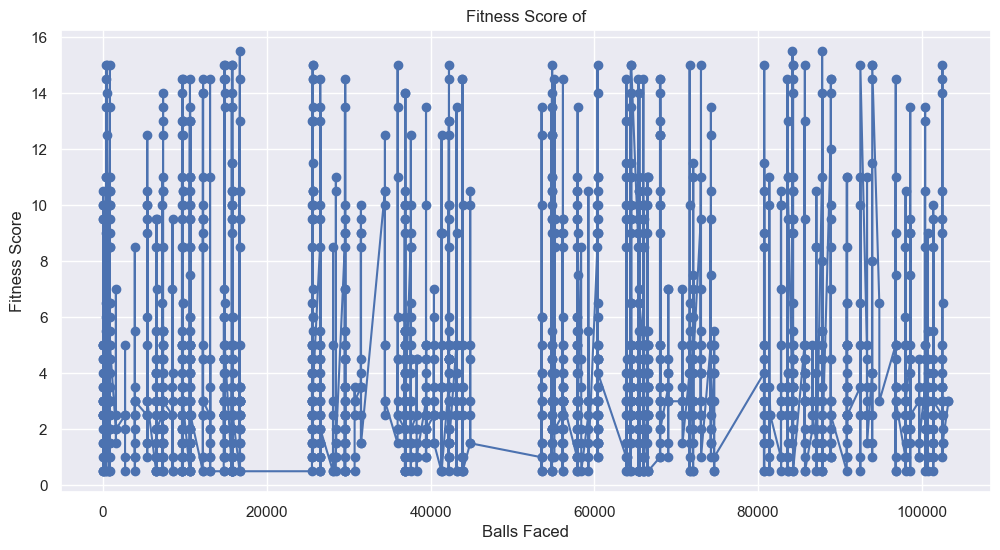

In [38]:
selected_player = 'JC Buttler'
player_data = delivery_data[delivery_data['batter'] == selected_player]
plt.figure(figsize=(12, 6))
plt.plot(player_data['fitness_score'], marker='o', color='b', linestyle='-')

plt.title(f'Fitness Score of' )
plt.xlabel('Balls Faced')
plt.ylabel('Fitness Score')
plt.grid(True)
plt.show()

In [45]:
match_data['Margin'] = pd.to_numeric(match_data['Margin'], errors='coerce')

In [48]:
#match_data['Win_Ratio'] = match_data['WinningTeam'] / match_data['Margin']

In [49]:
#print(match_data['Win_Ratio'])

In [51]:
#plt.figure(figsize=(10, 6))
#plt.bar(match_data['Team2'], match_data['Win_Ratio'], color='skyblue')
#plt.xlabel('Team2')
#plt.ylabel('Winning Ratio')
#plt.title('Winning Ratio of Teams')
#plt.ylim(0, 1)  # Set y-axis limits to show ratios between 0 and 1
#plt.show()

In [52]:
class Player:
    def __init__(self, name, health):
        self.name = name
        self.health = health

    def take_damage(self, damage):
        self.health -= damage
        if self.health >= 80:
            print("Player is Fit")
        elif 60 <= self.health < 80:
            print("Player is Moderate damage")
        else:
            print("Player is high damage")

    def show_health(self):
        print(f"{self.name}'s health is {self.health}")

player1 = Player("JC Buttler", 100)

damage_taken = 20
player1.take_damage(damage_taken)

player1.show_health()


Player is Fit
JC Buttler's health is 80


In [53]:
def plot_health_history(self):
        plt.plot(range(len(self.health_history)), self.health_history, marker='o')
        plt.xlabel('Damage Taken')
        plt.ylabel('Health')
        plt.title(f'{self.name}\'s Health History')
        plt.show()

In [54]:
player1 = Player("JC Buttle", 100)
damage_taken = [10, 20, 30, 15]
for damage in damage_taken:
    player1.take_damage(damage)
    player1.show_health()


Player is Fit
JC Buttle's health is 90
Player is Moderate damage
JC Buttle's health is 70
Player is high damage
JC Buttle's health is 40
Player is high damage
JC Buttle's health is 25
